# Filament Tools Suite (FiTSuite) - typecluster v0: Example Use Case
Last modified: 6/18/23, DL

Should just be able to run all and add your use case at the end. Parameters and inputs detailed below.

Suggest making a copy of this Jupyter notebook for each dataset to be processed so the full record of processing is stored

## Setup

### *General instructions*
The following is a simple way to set up an virtual environment with venv if you don't know how to:
- Run the following commands in a new terminal, then shutdown your current jupyter notebook and server
    - `python3 -m venv FiTSuite`
    - `source FiTSuite/bin/activate.csh` or `source FiTSuite/bin/activate`
    - `python3 -m pip install ipykernel`
    - `python3 -m ipykernel install --user --name=FiTSuite`
- Re-run the command `jupyter notebook` or `python3 -m notebook` or whatever you normally do and open this notebook
    - Currrently incompatible with JupyterLab 4 due to plotly issues... use JupyterLab 3 e.g. `pip install jupyterlab==3`
- Upon reopening, choose FiTSuite as Kernel by going to `Kernel > Change kernel > FiTSuite`

When done running the Jupyter notebook and shutting down the server, you can deactivate the virtual environment with `deactivate` in the second terminal

After you have done this once, next time just run `jupyter notebook` to get back here, and change kernel to `FiTSuite` again

### *LMB instructions*
The following is a simple way to set up an virtual environment with venv if you don't know how to:
- Run the following commands in a new terminal from your LMB home directory:
    - `module avail python`
        - Should see something like "python3/3.10.7" or higher
    - `module load python3/3.10.7` 
        - or whatever the latest version of python is
    - `python3 -m venv FiTSuite`
    - `source FiTSuite/bin/activate.csh` or `source FiTSuite/bin/activate`
    - `python3 -m pip install jupyter notebook` (could also be pip3)
        - Currrently incompatible with JupyterLab 4 due to plotly issues... use JupyterLab 3 e.g. `pip install jupyterlab==3`        
    - `python3 -m ipykernel install --user --name=FiTSuite`
- Run the command `jupyter notebook` or `python3 -m notebook` or whatever you normally do and open this notebook
- Upon reopening, choose FiTSuite as Kernel by going to `Kernel > Change kernel > FiTSuite`

When done running the Jupyter notebook and shutting down the server, you can deactivate the virtual environment with `deactivate`

After you have done this once, next time just reactivate the virtual environment, run `jupyter notebook` to get back here, and make sure kernel is still set to `FiTSuite`

Also, can source from my home directory -> `source lmb/home/dli/FiTSuite/bin/activate.csh`. This is likely easiest...

In [1]:
# If kernel is selected properly, should expect to see FiTSuite in the string below
import sys
print(sys.executable)

/Users/dli/Documents/FiTSuite/bin/python3


In [2]:
# Should be >=3.10
!python3 --version

Python 3.10.8


### Package Installation
FiTSuite requires a number of packages. These can be installed multiple ways, here are two:


1. Install using the `FiTSuite_requirements.txt`, e.g.
    ```
    # Run this ONLY the first time you create the venv to install all required packages (and some unnecessary ones oops)
    !python3 -m pip install -U -r FiTSuite_requirements.txt
    # Important relatively uncommon ones are starfile, seaborn, fastcluster, plotly, ipywidgets
    # NEED ipywidgets <= 8 because major overhaul that is not compatible with plotly
    ```
2. Install the missing packages explicitly, e.g. (may need to add more)
    ```
    # Install missing/uncommon packages
    !pip install fastcluster
    !pip install scikit-learn
    !pip install umap-learn
    !pip install starfile
    !pip install mrcfile
    !pip install plotly
    !pip install seaborn
    !pip install scikit-image
    !pip install ipywidgets==7.7.1 jupyterlab-widgets==1.1.1 
    # NEED ipywidgets <= 8 because major overhaul that is not compatible with plotly

    ! jupyter nbextension enable --py widgetsnbextension
    ```

In [3]:
# Import relevant packages (some are for other functions in FiTSuite)
import numpy as np
import pandas as pd
import starfile
import seaborn as sns
import collections
from collections import Counter
from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import fcluster, dendrogram
import scipy
import mrcfile
import fastcluster
import matplotlib.patches as patches
import IPython.display
from skimage import filters
import matplotlib.font_manager

# Packages for interactive functionality
from ipywidgets import widgets, interactive, HBox, VBox
import plotly.express as px
import plotly.graph_objects as go

# Uncomment only if you want to either use KMeans or compute dimensionality reduction plots
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
from sklearn.cluster import KMeans

! jupyter nbextension enable --py widgetsnbextension

/Users/dli/Documents/FiTSuite/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/dli/Documents/FiTSuite/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/dli/Documents/FiTSuite/lib/python3.10/site-packages/umap/distances.py:108

Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: OK


### Helper Functions

- File I/O
    - read_particle_star(filename: str) -> (pd.DataFrame, collections.OrderedDict)
    - read_models_star(filename: str) -> (pd.DataFrame, collections.OrderedDict)
    - read_mrcs_file(filename: str) -> (list, np.recarray)
    - read_mrc_file(filename: str) -> (np.ndarray, np.recarray)
    - write_particle_star(all_data: collections.OrderedDict, particle_df: pd.DataFrame, filename: str, overwrite: bool = True)
    - write_models_star(classes_df: pd.DataFrame, filename: str, overwrite: bool = True)
- Add columns to individual particle_df
    - hash_particle_df(particle_df: pd.DataFrame, verbose: bool = True) -> pd.DataFrame
    - add_classnumber_to_particle_df(hashed_particle_df: pd.DataFrame, particleHashClassDict: dict, verbose: bool = True) -> pd.DataFrame
    - add_classID_to_particle_df(hashed_particle_df: pd.DataFrame, classIDdict: dict, verbose: bool = True) -> pd.DataFrame
    - add_filamentID_to_particle_df(hashed_particle_df: pd.DataFrame, filamentIDdict: dict, verbose: bool = True) -> pd.DataFrame
    - add_particleID_to_particle_df(hashed_particle_df: pd.DataFrame, particleIDdict: dict, verbose: bool = True) -> pd.DataFrame
- Manipulating and calculating counts_df s
    - compute_particle_counts_df(hashed_particle_df: pd.DataFrame, classIDdict: dict = None, filamentIDdict: dict = None, verbose: bool = True) -> (pd.DataFrame, pd.DataFrame, Counter, dict, Counter, dict)
- Plotting
    - clusterplot_counts_df(counts_df: pd.DataFrame, filepath: str = None, savefig: bool = True, dpi: int = 300, metric: str = 'cosine', vmax: int = None, cmap: str = 'inferno', standardize: int = None, row_colors: list = None, col_colors: list = None, row_linkage: np.ndarray = None, col_linkage: np.ndarray = None, figsize_x: int = 25, figsize_y: int = 25, label_fontsize: int = 15, dendrogram_ratio: float = 0.2, colors_ratio: float = 0.03, cbar_pos: tuple = (0.02, 0.81, 0.05, 0.17), panel_label: bool = False, panel_label_letter: str = "a",  panel_label_fontsize: int = 15) -> sns.matrix.ClusterGrid
    - dimensionality_reduction_plot(counts_df, mode: str = "UMAP", savefig: bool = True, filepath: str = None, figsize_x: float = 25, figsize_y: float = 25, subfigure_label_fontsize = 25, title_fontsize = 30, axis_label_fontsize = 20, alpha = 0.1, row_colors: list = None, col_colors: list = None, random_seed: int = 365)
    - plot_class_averages(class_mrcs_file: str, frame_order: list = None, classes_df: pd.DataFrame = None, savefig: bool = True, filepath: str = None, dpi: int = 300, number_of_images: int = None, images_per_row: int = 10, label_x: int = 15, label_y: int = 225, label_fontsize: int = 10, figsize_x: float = 25, color_list: list = None, panel_label: bool = False, panel_label_letter: str = "c",  panel_label_fontsize: int = 15, panel_x = 0.013333, panel_y = 0.98)
- Computing and using clusterings
    - typecluster_initial_clustering(particles_star_file: str, output_path: str = None, savefig: bool = True, verbose: bool = True, metric: str = "cosine",  vmax: int = None, cmap: str = "inferno", standardize: int = None, figsize_x: int = 25, figsize_y: int =25, label_fontsize: int = 15, dpi: int = 300, dendrogram_ratio: float = 0.2, cbar_pos: tuple = (0.02, 0.81, 0.05, 0.17), panel_label: bool = False, panel_label_letter: str = "a",  panel_label_fontsize: int = 15) -> (sns.matrix.ClusterGrid, pd.DataFrame, pd.DataFrame, collections.OrderedDict, Counter, dict, Counter, dict)
    - reorder_class_average_star_by_clustered(model_star_file: str, clustered: sns.matrix.ClusterGrid, classIDdict: dict, output_path: str = None, savestar: bool = True, overwrite: bool = True) -> pd.DataFrame
    - reorder_counts_df_by_clustered(counts_df: pd.DataFrame, clustered: sns.matrix.ClusterGrid) -> pd.DataFrame
- Interactive Selection
    - typecluster_interactive_select(counts_df: pd.DataFrame, clustered: sns.matrix.ClusterGrid, vmax: int = 30, cmap: list = px.colors.sequential.Inferno, figsize_x: int = 1000, figsize_y: int =1000) -> list
    - typecluster_interactive_output(sliders: list, mode: str, output_path: str, clustered: sns.matrix.ClusterGrid, counts_df: pd.DataFrame, IDadded_particle_df: pd.DataFrame = None, all_data: collections.OrderedDict = None, classIDdict: dict = None, model_star_file: str = None, overwrite: bool = True, drophashes: bool = True) -> pd.DataFrame
- (Semi-)Automated Selection
    - typecluster_compute_kmeans_labels(counts_df, col_cluster_number: int = 10, row_cluster_number: int = 10, random_seed: int = 365) -> (list, list)
    - typecluster_dendrogram_threshold_select(clustered: sns.matrix.ClusterGrid, threshold: float)
    - typecluster_interactive_dendrogram_thresholding(clustered_df_name: str = "clustered") -> (widgets.FloatSlider, widgets.widget_box.HBox)
    - typecluster_compute_dendrogram_threshold_labels(clustered: sns.matrix.ClusterGrid, threshold: float, output_path: str, counts_df: pd.DataFrame, savefig: bool = True, vmax: int = None, cmap: str = "inferno", standardize: int = None, figsize_x: int = 25, figsize_y: int = 25, label_fontsize: int = 15, dpi: int = 300, dendrogram_ratio: float = 0.2, cbar_pos: tuple = (0.02, 0.81, 0.05, 0.17), panel_label: bool = False, panel_label_letter: str = "a",  panel_label_fontsize: int = 15) -> (list, Counter, sns.matrix.ClusterGrid)
    - convert_labels_to_colors(labels, color_dict: dict = None, plot_legend: bool = True, verbose: bool = True) -> list
    - typecluster_output_filaments_from_labels(col_labels: list, output_path: str, IDadded_particle_df: pd.DataFrame, all_data: collections.OrderedDict, particle_threshold: int = 1000, overwrite: bool = True, drophashes: bool = True, verbose: bool = True) -> pd.DataFrame

In [4]:
# Functions for file input/output
def read_particle_star(filename: str) -> (pd.DataFrame, collections.OrderedDict):
    '''
    Reads in particle star files, writes out a DataFrames with particles only and and an OrderedDict with all data
    '''
    if filename[-5:] != ".star":
        raise ValueError(f"{filename} is not in .star format")
    else:
        try:
            all_data = starfile.read(filename).copy()
            particle_df = all_data["particles"].copy()
        except:
            raise ValueError(f"Particle/data .star file {filename} does not contain particles or does not exist")
        return particle_df, all_data

def read_models_star(filename: str) -> (pd.DataFrame, collections.OrderedDict):
    '''
    Reads in models star files, writes out a DataFrames with model classes only and and an OrderedDict with all data
    '''
    if filename[-5:] != ".star":
        raise ValueError("File is not in .star format")
    else:
        try:
            all_data = starfile.read(filename).copy()
            models_df = all_data["model_classes"].copy()
        except:
            raise ValueError(f"Models .star file {filename} does not contain 2D classes or does not exist")
        return models_df, all_data
    
def read_mrcs_file(filename: str) -> (list, np.recarray):
    '''
    Reads in .mrcs files, writes out a list containing the frames and a Numpy recarray containing voxel sizes 
    '''
    if filename[-5:] != ".mrcs":
        raise ValueError(f"{filename} is not in .mrcs format")
    else:
        data = []
        try:
            with mrcfile.open(filename,permissive=True) as mrcs:
                for i, frame in enumerate(mrcs.data):
                    data.append(frame)
                voxel_size = mrcs.voxel_size
        except:
            raise ValueError(f"Unable to parse .mrcs file {filename}")
        return data, voxel_size
    
def read_mrc_file(filename: str) -> (np.ndarray, np.recarray):
    '''
    Reads in .mrc files, writes out a Numpy ndarray containing the data and a Numpy recarray containing voxel sizes 
    '''
    if filename[-4:] != ".mrc":
        raise ValueError(f"{filename} is not in .mrc format")
    else:
        try:
            with mrcfile.open(filename,permissive=True) as mrc:
                data = mrc.data
                voxel_size = mrc.voxel_size
        except:
            raise ValueError(f"Unable to parse .mrc file {filename}")
        return data, voxel_size
    
def write_particle_star(all_data: collections.OrderedDict, particle_df: pd.DataFrame, filename: str, overwrite: bool = True):
    '''
    Takes in the data_df as an OrderedDict and a DataFrame of particles and writes out a particle.star combining the two
    '''
    data_output = all_data.copy()
    data_output["particles"] = particle_df
    starfile.write(data_output, f"{filename}_particles.star", overwrite = overwrite)
    print("Particles saved as " + f"{filename}_particles.star")

def write_models_star(classes_df: pd.DataFrame, filename: str, overwrite: bool = True):
    '''
    Takes in classes as a DataFrame and writes out a classes.star
    '''
    starfile.write(classes_df, f"{filename}_classes.star", overwrite = overwrite)
    print("Class averages saved as " + f"{filename}_classes.star")
    
# Functions for adding columns to particle_df
def hash_particle_df(particle_df: pd.DataFrame, verbose: bool = True) -> pd.DataFrame:
    '''
    Adds a particle and filament hash to a copy of the input dataframe, replacing old hashes
    Optionally prints out total number of filaments and total particles
    '''
    hashed_particle_df = particle_df.copy()
    
    # Remove old hashes
    if "Hash ID" in hashed_particle_df.columns: # From old versions of FiTSuite, so keep for back compatibility
        if verbose:
            print("Dropping old 'Hash ID' column in hashed_particle_df")
        hashed_particle_df = hashed_particle_df.drop(columns = ["Hash ID"])
    if "Hash" in hashed_particle_df.columns: # From old versions of FiTSuite, so keep for back compatibility
        if verbose:
            print("Dropping old 'Hash' column in hashed_particle_df")
        hashed_particle_df = hashed_particle_df.drop(columns = ["Hash"])
    if "filamentHash" in hashed_particle_df.columns:
        if verbose:
            print("Dropping old 'filamentHash' column in hashed_particle_df")
        hashed_particle_df = hashed_particle_df.drop(columns = ["filamentHash"])
    if "particleHash" in hashed_particle_df.columns:
        if verbose:
            print("Dropping old 'particleHash' column in hashed_particle_df")
        hashed_particle_df = hashed_particle_df.drop(columns = ["particleHash"])
        
    # Add in hashes
    try:
        hashed_particle_df["filamentHash"] = hashed_particle_df["rlnHelicalTubeID"].astype(str) + hashed_particle_df["rlnMicrographName"]
        hashed_particle_df["particleHash"] = hashed_particle_df["rlnHelicalTubeID"].astype(str) + hashed_particle_df["rlnMicrographName"] + hashed_particle_df["rlnHelicalTrackLengthAngst"].astype(str)
    except:
        raise KeyError("Unable to hash particle_df as not all required fields exist")
        
    total_filaments = hashed_particle_df["filamentHash"].nunique()
    total_particles = hashed_particle_df["particleHash"].nunique()
    assert total_particles == len(hashed_particle_df.index), f"particle_df contains duplicate particles"
    if verbose:
        print(f"Total filaments: {total_filaments} and total particles: {total_particles}")
        
    return hashed_particle_df

def add_classnumber_to_particle_df(hashed_particle_df: pd.DataFrame, particleHashClassDict: dict, verbose: bool = True) -> pd.DataFrame:
    '''
    Takes in a hashed_particle_df and adds the rlnClassNumber of each particle from a dict to a copy of the DataFrame
    Replaces old rlnClassNumber if it exists
    '''
    classadded_particle_df = hashed_particle_df.copy()
    
    # Remove old labels
    if  'rlnClassNumber' in classadded_particle_df.columns:
        if verbose:
            print("Dropping old 'rlnClassNumber' column in classadded_particle_df")
        classadded_particle_df = classadded_particle_df.drop(columns = ["rlnClassNumber"])
    
    # Add in classes
    try:
        classadded_particle_df['rlnClassNumber']=classadded_particle_df['particleHash'].map(particleHashClassDict)
    except:
        raise KeyError("Unable to assign classes as not all particle assignments exist or particle_df not hashed")
     
    total_classes = classadded_particle_df['rlnClassNumber'].nunique()
    if verbose:
        print("Total classes:", total_classes)
        
    return classadded_particle_df

def add_classID_to_particle_df(hashed_particle_df: pd.DataFrame, classIDdict: dict, verbose: bool = True) -> pd.DataFrame:
    '''
    Takes in a hashed_particle_df and adds the classID of each particle from a dict to a copy of the DataFrame
    Replaces old classID if it exists
    '''
    classIDadded_particle_df = hashed_particle_df.copy()
    
    # Remove old labels
    if 'classID' in classIDadded_particle_df.columns:
        if verbose:
            print("Dropping old 'classID' column in classIDadded_particle_df")
        classIDadded_particle_df = classIDadded_particle_df.drop(columns = ["classID"])
    
    # Add in classes
    try:
        classIDadded_particle_df['classID'] = classIDadded_particle_df['rlnClassNumber'].map(classIDdict)
    except:
        raise KeyError("Unable to assign class IDs as not all class assignments exist or particle_df does not class numbers")
     
    total_classIDs = classIDadded_particle_df['classID'].nunique()
    if verbose:
        print("Total class IDs:", total_classIDs)
        
    return classIDadded_particle_df

def add_filamentID_to_particle_df(hashed_particle_df: pd.DataFrame, filamentIDdict: dict, verbose: bool = True) -> pd.DataFrame:
    '''
    Takes in a hashed_particle_df and adds the filamentID of each particle from a dict to a copy of the DataFrame
    Replaces old filamentID if it exists
    '''
    filamentIDadded_particle_df = hashed_particle_df.copy()
    
    # Remove old labels
    if  'filamentID' in filamentIDadded_particle_df.columns:
        if verbose:
            print("Dropping old 'filamentID' column in filamentIDadded_particle_df")
        filamentIDadded_particle_df = filamentIDadded_particle_df.drop(columns = ["filamentID"])
    
    # Add in classes
    try:
        filamentIDadded_particle_df['filamentID']=filamentIDadded_particle_df['filamentHash'].map(filamentIDdict)
    except:
        raise KeyError("Unable to assign filament IDs as not all particle assignments exist or particle_df not hashed")
     
    total_filamentIDs = filamentIDadded_particle_df['filamentID'].nunique()
    if verbose:
        print("Total filament IDs:", total_filamentIDs)
        
    return filamentIDadded_particle_df

def add_particleID_to_particle_df(hashed_particle_df: pd.DataFrame, particleIDdict: dict, verbose: bool = True) -> pd.DataFrame:
    '''
    Takes in a hashed_particle_df and adds the particleID of each particle from a dict to a copy of the DataFrame
    Replaces old particelID if it exists
    '''
    particleIDadded_particle_df = hashed_particle_df.copy()
    
    # Remove old labels
    if  'particleID' in particleIDadded_particle_df.columns:
        if verbose:
            print("Dropping old 'particleID' column in particleIDadded_particle_df")
        particleIDadded_particle_df = particleIDadded_particle_df.drop(columns = ["particleID"])
    
    # Add in classes
    try:
        particleIDadded_particle_df['particleID']=particleIDadded_particle_df['particleHash'].map(filamentIDdict)
    except:
        raise KeyError("Unable to assign particle IDs as not all particle assignments exist or particle_df not hashed")
     
    total_particleIDs = particleIDadded_particle_df['particleID'].nunique()
    if verbose:
        print("Total particle IDs:", total_particleIDs)
        
    return particleIDadded_particle_df

# Functions for computing or manipulating counts_df s
def compute_particle_counts_df(hashed_particle_df: pd.DataFrame, classIDdict: dict = None, filamentIDdict: dict = None, 
                               verbose: bool = True) -> (pd.DataFrame, pd.DataFrame, Counter, dict, Counter, dict):
    '''
    Computes (class x filament) dataframe of counts of particles per class per filament given a hashed_particle_df
    If provided with a previously computed classIDdict or filamentIDdict can use those too
    Also outputs other useful info - counts of particles per class/filament and dicts for filament/class hash to ID lookup
    '''
    # Check that input is valid
    assert "rlnClassNumber" in hashed_particle_df.columns, "hashed_particle_df does not contain class numbers"
    assert "filamentHash" in hashed_particle_df.columns, "hashed_particle_df does not contain filament hashes"
    
    # Compute dimensions of matrix and make up dicts to calculate IDs from
    total_classes = hashed_particle_df["rlnClassNumber"].nunique()
    total_filaments = hashed_particle_df["filamentHash"].nunique()
    total_particles = len(hashed_particle_df.index)
    classcount = Counter(hashed_particle_df["rlnClassNumber"].to_list())
    if classIDdict == None:
        classIDdict = {val:idx for idx, val in enumerate(sorted(classcount.keys()))}
    filamentcount = Counter(hashed_particle_df["filamentHash"].to_list())
    if filamentIDdict == None:
        filamentIDdict = {val:idx for idx, val in enumerate(filamentcount.keys())}
    if verbose:
        print(f"Total classes = {total_classes}, total particles = {total_particles} and total filaments = {total_filaments}")
        print("Particles per class: ", classcount)
    
    # Add filament and class IDs to hashed particles
    IDadded_particle_df = add_classID_to_particle_df(hashed_particle_df, classIDdict, verbose = False)
    IDadded_particle_df = add_filamentID_to_particle_df(IDadded_particle_df, filamentIDdict, verbose = False)

    #Compute counts_df (note that pivot table approach runs much slower)
    # counts_df = pd.pivot_table(IDadded_particle_df, values='particleHash', index='classID', columns='filamentID', aggfunc=pd.Series.nunique, fill_value = 0)
    countsmatrix = np.zeros((len(classIDdict),len(filamentIDdict)))
    for x, y in zip(IDadded_particle_df["classID"],IDadded_particle_df["filamentID"]):
        countsmatrix[x, y] += 1
    
    # Making row and col labels strings facilitates plotting, row labels are original class numbers
    counts_df = pd.DataFrame(countsmatrix, index = [str(x) for x in classIDdict.keys()], columns = [str(x) for x in range(len(filamentIDdict))])
    counts_df.index.name = "rlnClassNumber"
    counts_df.columns.name = "filamentID"
    
    return counts_df, IDadded_particle_df, classcount, classIDdict, filamentcount, filamentIDdict

# Functions for plotting figures
def clusterplot_counts_df(counts_df: pd.DataFrame, filepath: str = None, savefig: bool = True, dpi: int = 300,
                          metric: str = 'cosine', vmax: int = None, cmap: str = 'inferno', standardize: int = None,
                          row_colors: list = None, col_colors: list = None, 
                          row_linkage: np.ndarray = None, col_linkage: np.ndarray = None, 
                          figsize_x: int = 25, figsize_y: int = 25, label_fontsize: int = 15, 
                          dendrogram_ratio: float = 0.2, colors_ratio: float = 0.03, cbar_pos: tuple = (0.02, 0.81, 0.05, 0.17), 
                          panel_label: bool = False, panel_label_letter: str = "a",  panel_label_fontsize: int = 15) -> sns.matrix.ClusterGrid:
    '''
    Takes in counts_df and plots clustermap using a UPGMA/average hierarchical clustering
    Can modify various parameters and optionally save figure
    Refer to https://seaborn.pydata.org/generated/seaborn.clustermap.html for most params
    cmaps that are perceptually uniform sequential are viridis, plasma, inferno, magma, cividis
    '''
    clustered = sns.clustermap(counts_df, metric = metric, vmax = vmax, cmap = cmap, standard_scale = standardize,
                               figsize =(figsize_x, figsize_y), row_linkage = row_linkage, col_linkage = col_linkage,
                               row_colors = row_colors, col_colors = col_colors, cbar_kws={'label': 'Particle Counts'},
                               dendrogram_ratio = dendrogram_ratio, colors_ratio = colors_ratio, cbar_pos=cbar_pos)
    
    # Add labels
    clustered.ax_heatmap.set_ylabel("2D Class Average Numbers", fontsize = label_fontsize)
    clustered.ax_heatmap.set_xlabel("Filament IDs", fontsize = label_fontsize)
    cbar = clustered.ax_heatmap.collections[0].colorbar
    cbar.ax.yaxis.label.set_fontsize(label_fontsize)
    
    # For figure plotting can add a panel label, if you do this almost certainly want to move the cbar_pos 
    # With a panel_label_fontsize of 15, cbar_pos = (0.1, 0.82, 0.05, 0.16) seems to work
    if panel_label:
        font = {'fontname': 'Arial', 'fontsize': panel_label_fontsize, 'fontweight': 'bold'}
        plt.text(0.02, 0.97, panel_label_letter, fontdict = font, transform=plt.gcf().transFigure)
    plt.show()
    
    if savefig:
        if filepath != None:
            clustered.savefig(f"{filepath}_clustered.png", dpi=dpi)
            print("Figure saved as "+f"{filepath}_clustered.png")
        else:
            clustered.savefig("counts_df_clustered.png", dpi=dpi)
            print("Figure saved as counts_df_clustered.png")
    
    return clustered

def dimensionality_reduction_plot(counts_df, mode: str = "UMAP", savefig: bool = True, filepath: str = None, 
                                figsize_x: float = 25, figsize_y: float = 25, subfigure_label_fontsize = 25, 
                                title_fontsize = 30, axis_label_fontsize = 20, alpha = 0.1,
                                row_colors: list = None, col_colors: list = None, random_seed: int = 365):
    '''
    Performs dimensionality reduction on filaments or classes and plots/optionally saves figure
    Can choose from PCA/t-SNE/UMAP, and can also color by type by providing color labels
    Generally, no real reason to use this over the hierarchical clustering plot but it is available.
    '''
    # Choose right mode
    if mode == "PCA":
        optimiser = PCA(n_components=2, random_state = random_seed)
        # Seems weird to have a seed for PCA, but it just depends on the solver used
    elif mode == "t-SNE":
        optimiser = TSNE(n_components=2, random_state = random_seed)
    elif mode == "UMAP":
        optimiser = umap.UMAP(random_state = random_seed)
    else:
        raise ValueError("Mode not defined")
        
    # Compute dimensionality reduction
    countsmatrix = np.array(counts_df)
    ClassReduced = optimiser.fit_transform(countsmatrix)
    ClassReducedrownormed = optimiser.fit_transform(countsmatrix/np.sum(countsmatrix, axis=1, keepdims=True))
    FilsReduced = optimiser.fit_transform(np.transpose(countsmatrix))
    FilsReducedcolnormed = optimiser.fit_transform(np.transpose(countsmatrix/np.sum(countsmatrix, axis=0, keepdims=True)))

    # Plot figure
    fig, axs = plt.subplots(2, 2, figsize = (figsize_x, figsize_y))
    if row_colors == None:
        axs[0,0].scatter(ClassReduced[:, 0], ClassReduced[:, 1], alpha = alpha, s = 100)
        axs[0,1].scatter(ClassReducedrownormed[:, 0], ClassReducedrownormed[:, 1], alpha = alpha, s = 100)
    else:
        axs[0,0].scatter(ClassReduced[:, 0], ClassReduced[:, 1], alpha = alpha, s = 100, c = row_colors)
        axs[0,1].scatter(ClassReducedrownormed[:, 0], ClassReducedrownormed[:, 1], alpha = alpha, s = 100, c = row_colors)
    if col_colors == None:
        axs[1,0].scatter(FilsReduced[:, 0], FilsReduced[:, 1], alpha = alpha)
        axs[1,1].scatter(FilsReducedcolnormed[:, 0], FilsReducedcolnormed[:, 1], alpha = alpha)
    else:
        axs[1,0].scatter(FilsReduced[:, 0], FilsReduced[:, 1], alpha = alpha, c = col_colors)
        axs[1,1].scatter(FilsReducedcolnormed[:, 0], FilsReducedcolnormed[:, 1], alpha = alpha, c = col_colors)
    
    # Add labels, adjust layout
    axs[0,0].set_title("Class Averages", fontname = 'Arial', fontsize = subfigure_label_fontsize)
    axs[0,1].set_title("Normalized Class Averages", fontname = 'Arial', fontsize = subfigure_label_fontsize)
    axs[1,0].set_title("Unique Filaments", fontname = 'Arial', fontsize = subfigure_label_fontsize)
    axs[1,1].set_title("Normalized Unique Filaments", fontname = 'Arial', fontsize = subfigure_label_fontsize)
    for axis in [axs[0,0], axs[0,1], axs[1,0], axs[1,1]]:
        axis.set_xlabel(f"{mode} dimension 1", fontname = 'Arial', fontsize = axis_label_fontsize)
        axis.set_ylabel(f"{mode} dimension 2", fontname = 'Arial', fontsize = axis_label_fontsize)
    fig.suptitle(f"Dimensionality Reduction by {mode}", fontname = 'Arial', fontsize=title_fontsize, y = 0.99)
    plt.subplots_adjust(wspace=0.1, hspace=0.1, top=0.95)
    # plt.tight_layout()
    plt.show()
    
    if savefig:
        if filepath != None:
            fig.savefig(f"{filepath}_dimensionalityreduction_{mode}.png")
            print(f"Figure saved as {filepath}_dimensionalityreduction_{mode}.png")
        else:
            fig.savefig(f"counts_df_dimensionalityreduction_{mode}.png")
            print(f"Figure saved as counts_df_dimensionalityreduction_{mode}.png")
            
def plot_class_averages(class_mrcs_file: str, frame_order: list = None, classes_df: pd.DataFrame = None,
                        savefig: bool = True, filepath: str = None, dpi: int = 300,
                        number_of_images: int = None, images_per_row: int = 10, 
                        label_x: int = 15, label_y: int = 225,
                        label_fontsize: int = 10, figsize_x: float = 25, color_list: list = None,
                        panel_label: bool = False, panel_label_letter: str = "c",  panel_label_fontsize: int = 15,
                        panel_x = 0.013333, panel_y = 0.98):
    '''
    Plots specified number of class averages from a mrcs file or the maximum possible
    Can plot them in a specified order from a list/classes_df (frame_order prioritized over classes_df) with colors
    
    Params:
        class_mrcs_file = path to mrcs.star file as string (required)
        frame_order = list containing frames (indexed from 0) desired
        classes_df = DataFrame, containing the frames in their desired order in the 'rlnReferenceImage' column
        savefig = True or False, boolean flag
        filepath = path name that will be appended to the front of anything written out
        dpi = int, default 300
        number_of_images = int, number of images desired, will plot less if there aren't enough
        images_per_row = int, default 10
        label_fontsize = int, default 10
        figsize_x = float, default 25, width of figure, will be autoscaled
        color_list = list of colors already in the desired frame order
        label_x = 15
        label_y = 225
        panel_label: Controls whether to add panel label for figure making
        panel_label_letter: str, default "b",  
        panel_label_fontsize: int, default 15
        panel_x = 0.013333
        panel_y = 0.98
    '''
    frame_data, voxel_size = read_mrcs_file(class_mrcs_file)
    
    # Set up params
    if frame_order != None:
        frame_order_list = frame_order
    elif classes_df is not None:
        frame_order_list = [int(framename.split("@")[0])-1 for framename in classes_df['rlnReferenceImage']]
    else:
        frame_order_list = list(range(0, len(frame_data)))
        
    if number_of_images == None:
        n = len(frame_order_list)
    else:
        n = min(number_of_images, len(frame_order_list)) 
        
    # Plot figure
    if panel_label:
        fig, axes = plt.subplots(int(np.ceil(n/images_per_row)), images_per_row, figsize = (figsize_x, (int(np.ceil(n/images_per_row))+0.1)*figsize_x/images_per_row))
    else:
        fig, axes = plt.subplots(int(np.ceil(n/images_per_row)), images_per_row, figsize = (figsize_x, int(np.ceil(n/images_per_row))*figsize_x/images_per_row))
    axes = axes.flatten()
    width, height = frame_data[0].shape
    for i, ax in enumerate(axes):
        if i < n:
            try:
                ax.imshow(frame_data[frame_order_list[i]], cmap="gray", origin="lower")
                # sns.heatmap(frame_data[frame_order_list[i]], ax = ax, cmap = 'gray', cbar = False, square = True)
                ax.text(label_x, label_y, str(frame_order_list[i]+1), fontname = 'Arial', fontfamily = 'sans-serif', fontsize = label_fontsize, c = 'white') 
                ax.axis('off')
                if color_list is not None:
                    ax.add_patch(patches.Rectangle((0, 0), width, height, fill = False, lw = 4, ec = color_list[i]))
            except:
                ax.axis('off')
        else:
            ax.axis('off')
    if panel_label:
        font = {'fontname': 'Arial', 'fontsize': panel_label_fontsize, 'fontweight': 'bold'}
        fig.suptitle(panel_label_letter, x = panel_x, y = panel_y, fontname = 'Arial', fontsize = panel_label_fontsize, fontweight = 'bold') #fontdict = font)
        plt.tight_layout(w_pad = 0.1, h_pad = 0.1, pad = 0.4)
    else:
        plt.tight_layout(w_pad = 0.5) #, h_pad=0.5)  
    plt.show()
    
    if savefig:
        if filepath != None:
            fig.savefig(f"{filepath}_classaverages.png", dpi=dpi)
            print("Figure saved as "+f"{filepath}_classaverages.png")
        else:
            fig.savefig("classaverages.png", dpi=dpi)
            print("Figure saved as classaverages.png")
            
# Functions for generating clustering and using clustering
def typecluster_initial_clustering(particles_star_file: str, output_path: str = None, savefig: bool = True, verbose: bool = True,
                                   metric: str = "cosine",  vmax: int = None, cmap: str = "inferno", standardize: int = None, 
                                   figsize_x: int = 25, figsize_y: int =25, label_fontsize: int = 15, dpi: int = 300,
                                   dendrogram_ratio: float = 0.2, cbar_pos: tuple = (0.02, 0.81, 0.05, 0.17), 
                                   panel_label: bool = False, panel_label_letter: str = "a",  panel_label_fontsize: int = 15
                                   ) -> (sns.matrix.ClusterGrid, pd.DataFrame, pd.DataFrame, collections.OrderedDict, Counter, dict, Counter, dict):
    '''
    Computes 2D class x unique filament particle count matrix
    Plots and saves initial hierarchical clustering figure with distograms and performs other useful calculations
    If saved, hierachical clustering will be saved as {output_path}_clustered.png or "counts_df_clustered.png"
    
    General params:
        particles_star_file = path to particle/data.star file as string, needs to have rlnClassNumbers assigned
                              e.g. from Select or Class2D jobs (required!)
        savefig = True or False, boolean flag
        output_path = path name that will be appended to the front of anything written out
        verbose = True or False, boolean flag for extra text output
    
    Clustering Figure params (all optional):
        metric = distance metric as string, default is "cosine", "jaccard" and "euclidean" also can work well
        savefig = bool, default True, controls whether figures are saved
        vmax = int, maximum value for colormap in hierarchical clustering e.g. 15
        cmap = color map as string, default "inferno", ideally perceptually uniform sequential cmaps
        standardize = int, normalize counts matrix by row (0) or column (1)
        figsize_x, figsize_y = ints, default 25, figure dimensions to be saved
        label_fontsize: int, default 15, 
        dpi: int, default 300,
        dendrogram_ratio: float controlling ratio of plot that is dendrogram 
        cbar_pos: tuple = (0.02, 0.81, 0.05, 0.17), 
        panel_label: Controls whether to add panel label for figure making
        panel_label_letter: str, default "a",  
        panel_label_fontsize: int, default 15
    '''
    # Read in relevant data and calculate class x filament particle count matrix
    particle_df, all_data = read_particle_star(particles_star_file)
    hashed_particle_df = hash_particle_df(particle_df, verbose = False)
    counts_df, IDadded_particle_df, classcount, classIDdict, filamentcount, filamentIDdict = compute_particle_counts_df(hashed_particle_df, verbose = verbose) 
    
    # Compute and plot hierarchical clustering
    clustered = clusterplot_counts_df(counts_df, filepath = output_path, savefig = savefig, dpi = dpi,
                                      metric = metric, vmax = vmax, cmap = cmap, standardize = standardize,
                                      figsize_x = figsize_x, figsize_y = figsize_y, label_fontsize = label_fontsize, 
                                      dendrogram_ratio = dendrogram_ratio, cbar_pos = cbar_pos, 
                                      panel_label = panel_label, panel_label_letter = panel_label_letter,  panel_label_fontsize = panel_label_fontsize)
    
    return clustered, counts_df, IDadded_particle_df, all_data, classcount, classIDdict, filamentcount, filamentIDdict

def reorder_class_average_star_by_clustered(model_star_file: str, clustered: sns.matrix.ClusterGrid, classIDdict: dict,
                                            output_path: str = None, savestar: bool = True, overwrite: bool = True
                                           ) -> pd.DataFrame:
    '''
    Reorders class averages in a model_classes_df and appends a rlnClassNumber and clusteredOrder column
    Writes out if desired, and can be visualized by plot_class_averages
    
    Params:
        model_star_file = path to model.star file as string, required if classes are to be written out
        clustered = sns.matrix.ClusterGrid, output e.g. from typecluster_initial_clustering
        classIDdict = dict, output e.g. from typecluster_initial_clustering
        output_path = path name that will be appended to the front of anything written out
        savestar = bool, default True, controls whether reordered star file will be written out
        overwrite = bool, default True, controls whether it is okay to overwrite existing star
    '''
    # Read in order
    ordered_row_indices = clustered.dendrogram_row.reordered_ind
    classes_to_keep_dict = {classID:ordered_row_indices.index(classIDdict[classID]) for classID in classIDdict.keys()}

    # Read in and add columns to model_star
    model_classes_df, all_model_data = read_models_star(model_star_file)
    reordered_classes_df = model_classes_df.copy()
    reordered_classes_df['rlnClassNumber'] = list(np.arange(1,len(reordered_classes_df.index)+1))
    
    # Filter 2D class files with new order and write out
    reordered_classes_df = reordered_classes_df[reordered_classes_df['rlnClassNumber'].isin(set(classes_to_keep_dict.keys()))]
    reordered_classes_df['clusteredOrder'] = reordered_classes_df['rlnClassNumber'].map(classes_to_keep_dict)
    reordered_classes_df = reordered_classes_df.sort_values(by=['clusteredOrder'])
    
    if savestar:
        if output_path == None:
            output_path = "clustered"
        write_models_star(reordered_classes_df, filename = f"{output_path}_reordered", overwrite = overwrite)
    
    return reordered_classes_df

def reorder_counts_df_by_clustered(counts_df: pd.DataFrame, clustered: sns.matrix.ClusterGrid) -> pd.DataFrame:
    '''
    Takes in a counts_df and a clustermap and rearranges counts_df to match order
    '''
    new_cols = counts_df.columns[clustered.dendrogram_col.reordered_ind]
    new_ind = counts_df.index[clustered.dendrogram_row.reordered_ind]
    reordered_counts_df = counts_df.loc[new_ind, new_cols]
    return reordered_counts_df

# Functions for interactive selection, visualization and output
def typecluster_interactive_select(counts_df: pd.DataFrame, clustered: sns.matrix.ClusterGrid, vmax: int = 30, 
                                   cmap: list = px.colors.sequential.Inferno, figsize_x: int = 1000, 
                                   figsize_y: int =1000) -> list:
    '''
    Replots hierarchically ordered counts_df using plotly, allowing for interactive selection of params
    Parameters are then passed to an typecluster_interactive_output function
    
    Params:
        counts_df = DataFrame containing counts, e.g. from typecluster_initial_clustering
        clustered = Clustermap, e.g. from typecluster_initial_clustering
        vmax = int, maximum value for colormap in hierarchical clustering e.g. 15
        cmap = color map as list from plotly, default px.colors.sequential.Inferno
        figsize_x, figsize_y = ints, default 1000, figure dimensions to be saved as pixels
    '''
    # Compute new df that is reordered by the clustering
    clustered_df = reorder_counts_df_by_clustered(counts_df, clustered)
    clustered_df.index = [clustered_df.index[x]+"_"+str(x) for x in range(len(clustered_df.index))]
    clustered_df.columns = [clustered_df.columns[x]+"_"+str(x) for x in range(len(clustered_df.columns))]
    
    # Set up sliders
    ynum, xnum = clustered_df.shape
    x1 = widgets.IntSlider(value=1, min=0.0, max=xnum-1, step=1.0, description='x-start:', continuous_update=False)
    y1 = widgets.IntSlider(value=1, min=0.0, max=ynum-1, step=1.0, description='y-start:', continuous_update=False)
    x2 = widgets.IntSlider(value=2, min=0.0, max=xnum-1, step=1.0, description='x-end:', continuous_update=False)
    y2 = widgets.IntSlider(value=2, min=0.0, max=ynum-1, step=1.0, description='y-end:', continuous_update=False)
    container = widgets.HBox(children=[x1, y1, x2, y2])

    # Set up figure
    fig = px.imshow(clustered_df, aspect = 'auto', labels=dict(y="2D Class Number (name + coordinate #)", x="Filament Hash ID (name + coordinate #)", color="Counts"),
                   color_continuous_scale=cmap, range_color = [0,vmax])
    fig.add_selection(x0=1, y0=1, x1=2, y1=2, line=dict(color="White",width=1,dash="dash"))
    fig.update_layout(dragmode = "zoom")
    fig.update_layout(height = figsize_x, width = figsize_y)
    interactive_fig = go.FigureWidget(fig)

    # Set up interaction
    def response(change):
        with interactive_fig.batch_update():
            interactive_fig.layout.selections[0]['x0'] = x1.value
            interactive_fig.layout.selections[0]['x1'] = x2.value
            interactive_fig.layout.selections[0]['y0'] = y1.value
            interactive_fig.layout.selections[0]['y1'] = y2.value

    x1.observe(response, names="value")
    x2.observe(response, names="value")
    y1.observe(response, names="value")
    y2.observe(response, names="value")
    
    # Show figure
    sliders = [x1, x2, y1, y2]
    output = widgets.VBox([container, interactive_fig])
    display(output)
    
    return sliders
    
def typecluster_interactive_output(sliders: list, mode: str, output_path: str, clustered: sns.matrix.ClusterGrid, 
                                   counts_df: pd.DataFrame, IDadded_particle_df: pd.DataFrame = None, all_data: collections.OrderedDict = None,
                                   classIDdict: dict = None, model_star_file: str = None, overwrite: bool = True,
                                   drophashes: bool = True) -> pd.DataFrame:
    '''
    
    Params:
        sliders: list of 4 sliders from typecluster_interactive_select
        mode = can be "Filaments", "Classes", or "Particles" depending on what is to be written out
        output_path = path name that will be appended to the front of anything written out (e.g. /TypeClassifer/group1)
        counts_df = DataFrame containing counts, e.g. from typecluster_initial_clustering
        clustered = Clustermap, e.g. from typecluster_initial_clustering
        IDadded_particle_df = particle_df with filament and class IDs, e.g. from 
        all_data = original read in of star file
        model_star_file = path for model.star file, if mode = "Classes"
        overwrite = boolean that controls whether it is okay to overwrite existing star files
    '''
    # Extract values from sliders
    [x1, x2, y1, y2] = sliders
    class_start = min(y1.value, y2.value)
    class_end = max(y1.value, y2.value)
    hash_start = min(x1.value, x2.value)
    hash_end = max(x1.value, x2.value)
    ynum, xnum = counts_df.shape
    
    # Find indices corresponding to these regions
    if class_start != class_end:
        if class_end != ynum-1:
            selected_2D_class_inds = clustered.dendrogram_row.reordered_ind[class_start:class_end+1]
        else:
            selected_2D_class_inds = clustered.dendrogram_row.reordered_ind[class_start:]        
    else:
        selected_2D_class_inds = clustered.dendrogram_row.reordered_ind[class_start]
        
    if hash_start != hash_end:
        if hash_end != xnum-1:
            selected_hash_inds = clustered.dendrogram_col.reordered_ind[hash_start:hash_end+1]
        else:
            selected_hash_inds = clustered.dendrogram_col.reordered_ind[hash_start:]        
    else:
        selected_hash_inds = clustered.dendrogram_col.reordered_ind[hash_start]
    
    # Write df that only contains selected particles from clustered matrix
    all_selected_df = counts_df.loc[counts_df.index[selected_2D_class_inds], counts_df.columns[selected_hash_inds]]
    selected_classes = set([int(x) for x in all_selected_df.index])
    selected_filaments = set([int(x) for x in all_selected_df.columns])
    
    # Write out correct type of file
    if mode == "Classes": # Writing out all selected 2D classes
        assert (model_star_file is not None and classIDdict is not None), "Not all required inputs provided"
        filtered_df = reorder_class_average_star_by_clustered(model_star_file, clustered, classIDdict, savestar = False)
        filtered_df = filtered_df[filtered_df['rlnClassNumber'].isin(selected_classes)]
        write_models_star(filtered_df, f"{output_path}_selected", overwrite = overwrite)
    elif mode == "Filaments": # Writing out all particles from selected filaments
        assert (IDadded_particle_df is not None and all_data is not None), "Not all required inputs provided"
        filtered_df = IDadded_particle_df.copy()
        filtered_df = filtered_df[filtered_df["filamentID"].isin(selected_filaments)]
        if drophashes:
            try:
                columns_to_drop = list(set(["filamentID", "particleID", "filamentHash", "particleHash", "classID"]).intersection(filtered_df.columns))
                filtered_df = filtered_df.drop(columns = columns_to_drop)
            except:
                print("Unable to drop hashes")
        write_particle_star(all_data, filtered_df, f"{output_path}_selected_filament", overwrite = overwrite)
    elif mode == "Particles":
        assert (IDadded_particle_df is not None and all_data is not None), "Not all required inputs provided"
        filtered_df = IDadded_particle_df.copy()
        filtered_df = filtered_df[filtered_df["filamentID"].isin(selected_filaments)&filtered_df["rlnClassNumber"].isin(selected_classes)]
        if drophashes:
            try:
                columns_to_drop = list(set(["filamentID", "particleID", "filamentHash", "particleHash", "classID"]).intersection(filtered_df.columns))
                filtered_df = filtered_df.drop(columns = columns_to_drop)
            except:
                print("Unable to drop hashes")
        write_particle_star(all_data, filtered_df, f"{output_path}_selected", overwrite = overwrite)
    else:
        raise ValueError("Current mode is undefined. Please choose from 'Classes', 'Filaments', or 'Particles'")
    
    return filtered_df

# Functions for automated cluster selection, visualization, and output
def typecluster_compute_kmeans_labels(counts_df, col_cluster_number: int = 10, row_cluster_number: int = 10, random_seed: int = 365) -> (list, list): 
    '''
    Compute k-means labels for class averages (row_clusters) and unique filaments (col_clusters)
    Returns a list for each containing the cluster number of each
    '''
    countsmatrix = np.array(counts_df)
    # Compute k-means on rows without normalization, but could in theory do /np.sum(countsmatrix, axis=0, keepdims=True))
    row_labels = KMeans(n_clusters=row_cluster_number, random_state=random_seed, n_init = 'auto').fit_predict(countsmatrix) 
    # Column k-means done with normalization
    countsmatrix_colnormalized = countsmatrix/np.sum(countsmatrix, axis=0, keepdims=True)
    col_labels = KMeans(n_clusters=col_cluster_number, random_state=random_seed, n_init = 'auto').fit_predict(np.transpose(countsmatrix_colnormalized))
    return row_labels, col_labels

def typecluster_dendrogram_threshold_select(clustered: sns.matrix.ClusterGrid, threshold: float):
    '''
    Can try out various cosine distance thresholds here and visualize on the distogram
    '''
    fig, ax = plt.subplots(figsize = (40, 25))
    dendrogram(clustered.dendrogram_col.linkage, ax = ax, color_threshold = threshold, no_labels = True)
    
def typecluster_interactive_dendrogram_thresholding(clustered_df_name: str = "clustered") -> (widgets.FloatSlider, widgets.widget_box.HBox):
    '''
    SUPER hacky way to do interactive threshold selection on dendrograms
    Wish it was done in a much better way but wasted too much time trying to fix a widgets implementation
    Notably, second output needs to be hbox
    '''
    # Set up widgets
    threshold_slider = widgets.FloatSlider(min=0, max=1, step=0.001, description='Threshold:', readout_format='.3f')
    run_button = widgets.Button(description='Run')
    
    # Set up response
    def run_button_clicked(button):
        command1 = "IPython.display.clear_output()" # So we don't keep a bunch of plots
        exec(command1)
        command2 = "display(hbox)" # Have to regenerate sliders, and thus need to return it as well
        exec(command2)
        command3 = f"typecluster_dendrogram_threshold_select({clustered_df_name}, {threshold_slider.value})"
        exec(command3)
    
    # Make widget
    run_button.on_click(run_button_clicked)
    hbox = widgets.HBox([threshold_slider, run_button])
    display(hbox)
    return threshold_slider, hbox

def typecluster_compute_dendrogram_threshold_labels(clustered: sns.matrix.ClusterGrid, threshold: float, 
                                                    output_path: str, counts_df: pd.DataFrame, savefig: bool = True,
                                                    vmax: int = None, cmap: str = "inferno", standardize: int = None,
                                                    figsize_x: int = 25, figsize_y: int = 25, label_fontsize: int = 15, 
                                                    dpi: int = 300, dendrogram_ratio: float = 0.2, cbar_pos: tuple = (0.02, 0.81, 0.05, 0.17), 
                                                    panel_label: bool = False, panel_label_letter: str = "a",  panel_label_fontsize: int = 15
                                                   ) -> (list, Counter, sns.matrix.ClusterGrid):
    '''
    Uses fcluster to find filament clusters under a minimum distance_threshold (nominally cosine distance)
    Outputs cluster labels for filaments and a counter of filaments/cluster
    Also plots labeled clusters on clustermap
    
    Params:
        clustered = Clustermap, e.g. from typecluster_initial_clustering
        threshold = float that is the maximum average cosine distance for a cluster
                    probably either a float threshold or threshold_slider.value
        counts_df = DataFrame containing counts, e.g. from typecluster_initial_clustering
        output_path = path name that will be appended to the front of anything written out (e.g. /TypeClassifer/group1)
        
    Otherwise, most params the same as `typecluster_initial_clustering` for visualization purposes
    '''
    col_clustered_labels = fcluster(clustered.dendrogram_col.linkage, t=threshold, criterion='distance')
    
    # Compute figure
    col_color_labels = convert_labels_to_colors(col_clustered_labels)
    output_pathused = output_path+f"_{threshold}threshold"
    labeled_clustered = clusterplot_counts_df(counts_df, filepath = output_pathused, savefig = savefig, dpi = dpi,
                                              row_linkage = clustered.dendrogram_row.linkage, col_linkage = clustered.dendrogram_col.linkage,
                                              col_colors = col_color_labels, vmax = vmax, cmap = cmap, standardize = standardize,
                                              figsize_x = figsize_x, figsize_y = figsize_y, label_fontsize = label_fontsize, 
                                              dendrogram_ratio = dendrogram_ratio, cbar_pos = cbar_pos, 
                                              panel_label = panel_label, panel_label_letter = panel_label_letter,  panel_label_fontsize = panel_label_fontsize)

    return col_clustered_labels, labeled_clustered

def convert_labels_to_colors(labels, color_dict: dict = None, plot_legend: bool = True, verbose: bool = True) -> list:
    '''
    Converts a list of labels (ints) to a list of colors either through a specificed color_dict or by uniform sampling
    '''
    counted_labels = Counter(labels)
    if verbose:
        print(f"Number of filaments/classes per label: {counted_labels}")
    unique_labels = len(counted_labels.keys())
    
    if color_dict != None:
        assert len(color_dict) >= unique_labels, "Not enough colors specified in provided color_dict"
        try:
            colors = [color_dict[label] for label in labels]
        except:
            raise KeyError("Unable to convert labels to colors using provided color_dict")
    else:
        colors = sns.color_palette("husl", unique_labels)
        color_dict = {label_id: colors[i] for i, label_id in enumerate(counted_labels.keys())}
        colors = [color_dict[label] for label in labels]
    
    if plot_legend:
        # Create subplots for each color
        num_rows = int(np.ceil(unique_labels/20))
        fig, axs = plt.subplots(num_rows, 20, figsize=(20, num_rows))

        # Flatten the axs array if it has multiple dimensions
        if isinstance(axs, np.ndarray):
            axs = axs.flatten()

        # Iterate over the color list and display each color in a subplot
        for i, label in enumerate(sorted(counted_labels.keys())):
            ax = axs[i]
            ax.set_facecolor(color_dict[label])
            ax.set_xticks([])
            ax.set_yticks([])
            ax.set_title(str(label))
        
        # Remove empty subplots if necessary
        if unique_labels < len(axs):
            for j in range(unique_labels, len(axs)):
                axs[j].axis('off')
        
        # Adjust spacing between subplots
        plt.subplots_adjust(hspace=0.5, wspace=0.1)
        plt.show()
    
    return colors

def typecluster_output_filaments_from_labels(col_labels: list, output_path: str, IDadded_particle_df: pd.DataFrame,
                                             all_data: collections.OrderedDict, particle_threshold: int = 1000, 
                                             overwrite: bool = True, drophashes: bool = True, verbose: bool = True
                                            ) -> pd.DataFrame:
    '''
    Writes out .star files containing particles from clusters with particle #s exceeding a threshold
    Clusters that fail this threshold are merged and output as one joint merged particle .star file
    Filament clusters specified by col_labels as a list, which come from k-means or distogram thresholding
    
    Params:
        col_labels = List of labels, probably from kmeans or distogram thresholding
        output_path = path name that will be appended to the front of anything written out (e.g. /TypeClassifer/job009)
        IDadded_particle_df = DataFrame with filamentIDs, probably from typecluster_initial_clustering
        all_data = reading in from read_particle_star, template for output
        particle_threshold = minimum number of particles in a filament cluster to output it standalone (float or int)
        overwrite = boolean that controls whether it is okay to overwrite existing star files
        drophashes = boolean that controls whether to drop hashes when writing out star files
        verbose = boolean that controls verbosity of text output
    '''
    
    # Compute some stats
    counted_labels = Counter(col_labels)
    num_filaments = IDadded_particle_df['filamentID'].nunique()
    num_particles = len(IDadded_particle_df.index)
    if verbose:
        print(f"Number of filaments/classes per label: {counted_labels}")
    
    # Map particles to label
    labeled_particle_df = IDadded_particle_df.copy()
    filamentID_label_dict = {i: label for i, label in enumerate(col_clustered_labels)}
    if 'clusterLabel' in labeled_particle_df.columns:
        labeled_particle_df = labeled_particle_df.drop(columns = ["clusterLabel"])
    labeled_particle_df['clusterLabel'] = labeled_particle_df['filamentID'].map(filamentID_label_dict)
    
    # Iterate through clusters and extract particles
    failed_cluster_labels = []
    for cluster_label in sorted(counted_labels.keys()):
        filtered_df = labeled_particle_df.copy()
        filtered_df = filtered_df[filtered_df['clusterLabel']==cluster_label]
        filtered_particle_count = filtered_df.shape[0]
        
        # Write out if passing particle threshold, else, group with other clusters that failed
        if filtered_particle_count >= particle_threshold:
            if drophashes:
                try: # We keep cluster labels but could also drop in the future, it helps keep dimensions consistent
                    columns_to_drop = list(set(["filamentID", "particleID", "filamentHash", "particleHash", "classID"]).intersection(filtered_df.columns))
                    filtered_df = filtered_df.drop(columns = columns_to_drop)
                except:
                    print("Unable to drop hashes")
            if verbose:
                print(f"{filtered_particle_count} particles from filament cluster {cluster_label}")
            write_particle_star(all_data, filtered_df, f"{output_path}_cluster{cluster_label}", overwrite = overwrite)
        else:
            failed_cluster_labels.append(cluster_label)
 
    # Deal with all of the failed clusters, if any
    num_failed_filaments = 0
    num_failed_particles = 0
    if failed_cluster_labels != []:
        failed_clusters_df = labeled_particle_df.copy()
        failed_clusters_df = failed_clusters_df[failed_clusters_df['clusterLabel'].isin(set(failed_cluster_labels))]
        num_failed_filaments = failed_clusters_df['filamentID'].nunique()
        num_failed_particles = len(failed_clusters_df.index)
        if verbose:
            print(f"Clusters {failed_cluster_labels} did not pass particle threshold of {particle_threshold}, so {num_failed_particles} particles will be merged together.")
        write_particle_star(all_data, failed_clusters_df, f"{output_path}_clustersfailed", overwrite = overwrite)
        
    # Output summary statistics and output relevant df
    if verbose:
        print(f"{num_failed_particles} particles out of {num_particles} total particles in merged clusters = {num_failed_particles/num_particles*100}%.")
        print(f"{num_failed_filaments} filaments out of {num_filaments} total filaments in merged clusters = {num_failed_filaments/num_filaments*100}%.")
    return labeled_particle_df

## Suggestions

Works best with manually extracted filaments instead of auto-picked filaments as auto-picked filaments are more likely wrong/short. As such, information about filament structure is then lost. 

It also works better if particles are not randomly split up by a selection tasks, so all particles in any given filament are retained. Can run with a lot of particles as long as number of filaments and number of clusters are relatively low (<50,000 for fast performance on mac) as run time scales as (# of filaments choose 2). 

Can repeat the selection and output functions as many times as needed, just copy and paste the relevant commands.

Suggest using automated selection and output on the first high-level 2D classification job, and iterating with extraction/2D classification until the data looks homogenous. Can use interactive selection/output throughout to visualize or output specific filament types/data that you care about. 

It is typically easiest to mount directly onto /cephfs or /cephfs2 and read/write into there.

## Example Use Case

### Initial Clustering

Let's first read in the data and produce an initial clustering using `typecluster_initial_clustering`. This saves a figure (if desired) of the clustered heatmap and churns out a slew of useful data structures for other functions. 

We will also use the clustered heatmap to reorder the classaverages associated with this 2D classification (and optionally written out in standard RELION format) using `reorder_class_average_star_by_clustered` and then plotted by `plot_class_averages`.

You can view the reordered_classes.star file directly in RELION.

In [5]:
help(typecluster_initial_clustering)

Help on function typecluster_initial_clustering in module __main__:

typecluster_initial_clustering(particles_star_file: str, output_path: str = None, savefig: bool = True, verbose: bool = True, metric: str = 'cosine', vmax: int = None, cmap: str = 'inferno', standardize: int = None, figsize_x: int = 25, figsize_y: int = 25, label_fontsize: int = 15, dpi: int = 300, dendrogram_ratio: float = 0.2, cbar_pos: tuple = (0.02, 0.81, 0.05, 0.17), panel_label: bool = False, panel_label_letter: str = 'a', panel_label_fontsize: int = 15) -> (<class 'seaborn.matrix.ClusterGrid'>, <class 'pandas.core.frame.DataFrame'>, <class 'pandas.core.frame.DataFrame'>, <class 'collections.OrderedDict'>, <class 'collections.Counter'>, <class 'dict'>, <class 'collections.Counter'>, <class 'dict'>)
    Computes 2D class x unique filament particle count matrix
    Plots and saves initial hierarchical clustering figure with distograms and performs other useful calculations
    If saved, hierachical clustering will

In [6]:
help(reorder_class_average_star_by_clustered)

Help on function reorder_class_average_star_by_clustered in module __main__:

reorder_class_average_star_by_clustered(model_star_file: str, clustered: seaborn.matrix.ClusterGrid, classIDdict: dict, output_path: str = None, savestar: bool = True, overwrite: bool = True) -> pandas.core.frame.DataFrame
    Reorders class averages in a model_classes_df and appends a rlnClassNumber and clusteredOrder column
    Writes out if desired, and can be visualized by plot_class_averages
    
    Params:
        model_star_file = path to model.star file as string, required if classes are to be written out
        clustered = sns.matrix.ClusterGrid, output e.g. from typecluster_initial_clustering
        classIDdict = dict, output e.g. from typecluster_initial_clustering
        output_path = path name that will be appended to the front of anything written out
        savestar = bool, default True, controls whether reordered star file will be written out
        overwrite = bool, default True, control

In [7]:
help(plot_class_averages)

Help on function plot_class_averages in module __main__:

plot_class_averages(class_mrcs_file: str, frame_order: list = None, classes_df: pandas.core.frame.DataFrame = None, savefig: bool = True, filepath: str = None, dpi: int = 300, number_of_images: int = None, images_per_row: int = 10, label_x: int = 15, label_y: int = 225, label_fontsize: int = 10, figsize_x: float = 25, color_list: list = None, panel_label: bool = False, panel_label_letter: str = 'c', panel_label_fontsize: int = 15, panel_x=0.013333, panel_y=0.98)
    Plots specified number of class averages from a mrcs file or the maximum possible
    Can plot them in a specified order from a list/classes_df (frame_order prioritized over classes_df) with colors
    
    Params:
        class_mrcs_file = path to mrcs.star file as string (required)
        frame_order = list containing frames (indexed from 0) desired
        classes_df = DataFrame, containing the frames in their desired order in the 'rlnReferenceImage' column
     

Total classes = 114, total particles = 317057 and total filaments = 4984
Particles per class:  Counter({12: 16334, 30: 9611, 66: 8142, 155: 8121, 15: 8082, 142: 8039, 75: 7705, 78: 7492, 110: 7401, 5: 7266, 69: 7209, 44: 6599, 107: 6230, 6: 5857, 144: 5572, 4: 5540, 14: 5165, 76: 5096, 61: 4905, 72: 4880, 96: 4853, 104: 4837, 99: 4759, 94: 4678, 84: 4633, 151: 4510, 21: 4321, 36: 4218, 74: 3878, 24: 3868, 58: 3793, 106: 3755, 28: 3745, 87: 3710, 160: 3708, 100: 3706, 89: 3648, 40: 3625, 50: 3576, 17: 3535, 85: 3424, 54: 3330, 79: 3221, 156: 3203, 10: 3203, 146: 3192, 83: 3187, 117: 3066, 127: 3062, 98: 3047, 64: 3023, 147: 2945, 11: 2851, 45: 2633, 112: 2519, 93: 2500, 152: 2339, 154: 2241, 80: 2209, 81: 2126, 23: 2030, 86: 1961, 8: 1858, 116: 1844, 56: 1816, 105: 1766, 47: 1682, 34: 1672, 18: 1638, 158: 1420, 101: 1329, 16: 1315, 43: 1278, 119: 1230, 109: 1200, 114: 1176, 27: 1162, 49: 1099, 95: 956, 97: 862, 60: 838, 103: 830, 82: 513, 9: 481, 55: 192, 124: 189, 122: 184, 102: 124, 1

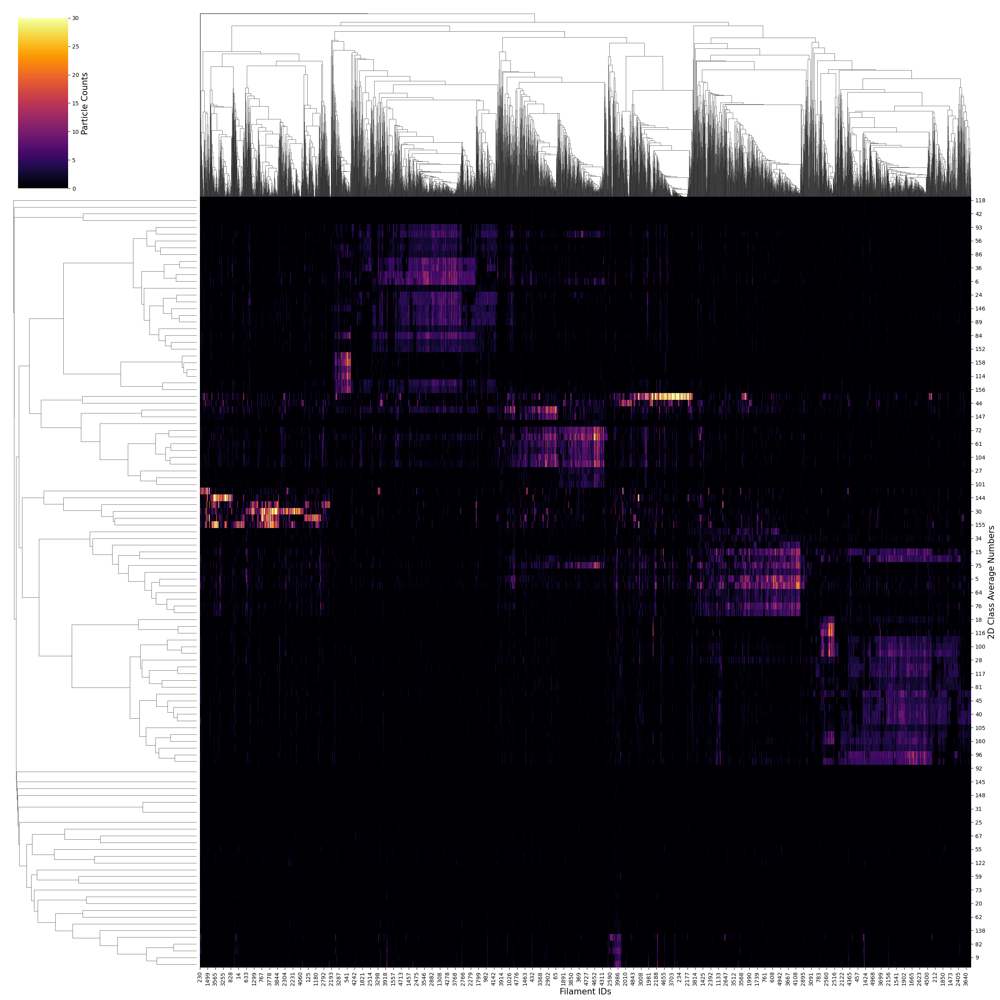

Figure saved as ../ExampleOutput/SL251-2_job007_run_it045_clustered.png
Class averages saved as ../ExampleOutput/SL251-2_job007_run_it045_reordered_classes.star


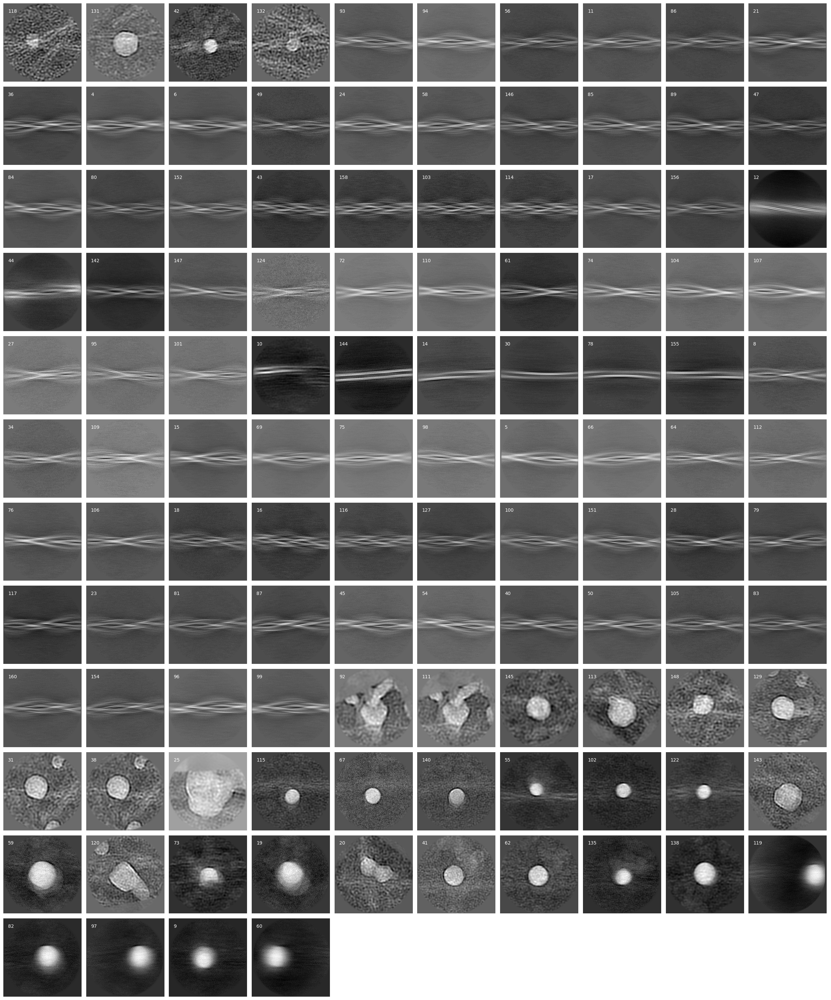

Figure saved as ../ExampleOutput/SL251-2_job007_run_it045_classaverages.png


In [8]:
# Key Parameters:
particle_star = "../ExampleData/SL251-2_job007_run_it045_data.star" # Path to data.star file from Class2D job
model_star = "../ExampleData/SL251-2_job007_run_it045_model.star" # Path to model.star file from Class2D job
class_mrcs = "../ExampleData/SL251-2_job007_run_it045_classes.mrcs" # Path to classes.mrcs file from Class2D job
output = "../ExampleOutput/SL251-2_job007_run_it045" # Desired output path that will be appended to all outputs
savefig = True # Controls whether or not to save the clustered heatmap figure
savestar = True # Controls whether or not to save the reordered class averages 
saveclassaverageplot = True # Controls whether or not to save the class average figures
overwrite = False # Controls whether it is okay to overwrite existing .star files with the same name

clustered, counts_df, IDadded_particle_df, all_data, classcount, classIDdict, filamentcount, filamentIDdict = typecluster_initial_clustering(particle_star, output_path = output, savefig = savefig, vmax = 30)
reordered_classes_df = reorder_class_average_star_by_clustered(model_star, clustered, classIDdict, output_path = output, savestar = savestar, overwrite = overwrite)
plot_class_averages(class_mrcs, classes_df = reordered_classes_df, savefig = saveclassaverageplot, filepath = output)

### Cluster Selection
Now that we've done this initial clustering, we can see that there are multiple distinct clusters in the clustered heatmap. We can now select subgroups of particles in 3 ways:
- By directly selecting and outputing groups interactively using `typecluster_interactive_select` and `typecluster_interactive_output`
- By thresholding the dendrogram in the hierarchical clustering using `typecluster_interactive_dendrogram_thresholding`, `typecluster_compute_dendrogram_threshold_labels`, and `typecluster_output_filaments_from_labels`  
- By k-means on the normalized filament distributions using `typecluster_compute_kmeans_labels` and `typecluster_output_filaments_from_labels` 

I suggest using dendrogram thresholding and output on the first high-level 2D classification job, and iterating with extraction/2D classification/dendrogram thresholding until the data looks homogenous. Can use interactive selection/output throughout to visualize or output specific filament types/data that you care about. Only use k-means if the hierarchical clustering is prohibitively large.

#### Interactive Selection

First, here is the interactive selection and output option:
- We select the desired group using `typecluster_interactive_select`
- We can then write out either the class averages, particles, or any particles in the filaments in our selection by changing the mode within `typecluster_interactive_output`

For this example, we write out all 3 and then display the selected classaverages using `plot_class_averages`

In [9]:
help(typecluster_interactive_select)

Help on function typecluster_interactive_select in module __main__:

typecluster_interactive_select(counts_df: pandas.core.frame.DataFrame, clustered: seaborn.matrix.ClusterGrid, vmax: int = 30, cmap: list = ['#000004', '#1b0c41', '#4a0c6b', '#781c6d', '#a52c60', '#cf4446', '#ed6925', '#fb9b06', '#f7d13d', '#fcffa4'], figsize_x: int = 1000, figsize_y: int = 1000) -> list
    Replots hierarchically ordered counts_df using plotly, allowing for interactive selection of params
    Parameters are then passed to an typecluster_interactive_output function
    
    Params:
        counts_df = DataFrame containing counts, e.g. from typecluster_initial_clustering
        clustered = Clustermap, e.g. from typecluster_initial_clustering
        vmax = int, maximum value for colormap in hierarchical clustering e.g. 15
        cmap = color map as list from plotly, default px.colors.sequential.Inferno
        figsize_x, figsize_y = ints, default 1000, figure dimensions to be saved as pixels



In [10]:
'''
CELL 1 OF 2 FOR INTERACTIVE SELECTION/OUTPUT, COPY AND PASTE AS NEEDED

Note: indexes from 0 and we don't actually need x-end > x-start or y-end > y-start
The start and end coordinate x-y pairs are connected though
Selections include the boxes where the dotted outlines appear
Can save an image of your selection with the camera-looking "Download plot as a png" button
'''

sliders = typecluster_interactive_select(counts_df, clustered)
# We can keep track of our selected group here: group1, x: 860-976 y: 20-28

In [11]:
help(typecluster_interactive_output)

Help on function typecluster_interactive_output in module __main__:

typecluster_interactive_output(sliders: list, mode: str, output_path: str, clustered: seaborn.matrix.ClusterGrid, counts_df: pandas.core.frame.DataFrame, IDadded_particle_df: pandas.core.frame.DataFrame = None, all_data: collections.OrderedDict = None, classIDdict: dict = None, model_star_file: str = None, overwrite: bool = True, drophashes: bool = True) -> pandas.core.frame.DataFrame
    Params:
        sliders: list of 4 sliders from typecluster_interactive_select
        mode = can be "Filaments", "Classes", or "Particles" depending on what is to be written out
        output_path = path name that will be appended to the front of anything written out (e.g. /TypeClassifer/group1)
        counts_df = DataFrame containing counts, e.g. from typecluster_initial_clustering
        clustered = Clustermap, e.g. from typecluster_initial_clustering
        IDadded_particle_df = particle_df with filament and class IDs, e.g. f

Now we that we've made our selection, we can choose
- to write out the selected 2D classes to view: set Mode to "Classes"
- to write out the all particles within the filaments in the selection: set Mode to "Filaments"
- to write out the specific particles in the selection: set Mode to "Particles"

Let's just do them all for now...

[860, 976, 20, 28]
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045_group1_selected_filament_particles.star
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045_group1_selected_particles.star
Class averages saved as ../ExampleOutput/SL251-2_job007_run_it045_group1_selected_classes.star


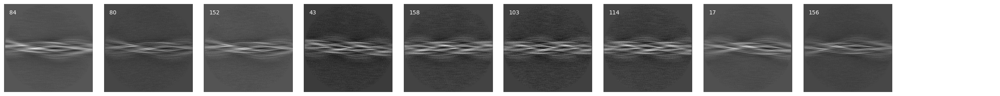

Figure saved as ../ExampleOutput/SL251-2_job007_run_it045_group1_classaverages.png


,rlnReferenceImage,rlnClassDistribution,rlnAccuracyRotations,rlnAccuracyTranslationsAngst,rlnEstimatedResolution,rlnOverallFourierCompleteness,rlnClassPriorOffsetX,rlnClassPriorOffsetY,rlnHelicalRise,rlnHelicalTwist,rlnClassNumber,clusteredOrder
83,000084@Class2D/job007/run_it045_classes.mrcs,0.014611,0.05,0.2908,6.646857,0.999873,0.006238,0.058019,4.75,0.0,84,20
79,000080@Class2D/job007/run_it045_classes.mrcs,0.006971,999.00,999.0000,7.089981,0.995566,0.004003,0.013252,4.75,0.0,80,21
151,000152@Class2D/job007/run_it045_classes.mrcs,0.007376,999.00,999.0000,6.829798,1.000000,0.004298,0.021687,4.75,0.0,152,22
42,000043@Class2D/job007/run_it045_classes.mrcs,0.004012,999.00,999.0000,8.180747,1.000000,0.003089,-0.004090,4.75,0.0,43,23
157,000158@Class2D/job007/run_it045_classes.mrcs,0.004471,999.00,999.0000,8.004817,0.999819,0.002321,-0.006010,4.75,0.0,158,24
102,000103@Class2D/job007/run_it045_classes.mrcs,0.002618,999.00,999.0000,8.004817,1.000000,-0.000896,0.002492,4.75,0.0,103,25
113,000114@Class2D/job007/run_it045_classes.mrcs,0.003713,999.00,999.0000,7.919660,0.998950,-0.002310,-0.001310,4.75,0.0,114,26
16,000017@Class2D/job007/run_it045_classes.mrcs,0.011124,0.05,0.2908,8.004817,1.000000,-0.005560,-0.018990,4.75,0.0,17,27
155,000156@Class2D/job007/run_it045_classes.mrcs,0.010116,0.05,0.2908,7.298510,1.000000,0.003770,-0.014450,4.75,0.0,156,28


In [12]:
'''
CELL 2 OF 2 FOR INTERACTIVE SELECTION/OUTPUT, COPY AND PASTE AS NEEDED
'''

# Key Parameters:
selection_output = output + "_group1" # Path to write out selection to 
saveclassaverageplot = True
overwrite = False # Controls whether it is okay to overwrite existing .star files with the same name
# These functions also require the parameters and data structures from the initial clustering cell

# Comment out any of the lines below that you do not want to output!
print([slider.value for slider in sliders]) # Just to remember what we selected in the previous cell
typecluster_interactive_output(sliders, "Filaments", selection_output, clustered, counts_df, IDadded_particle_df = IDadded_particle_df, all_data = all_data, model_star_file = model_star, classIDdict = classIDdict, overwrite = overwrite)
typecluster_interactive_output(sliders, "Particles", selection_output, clustered, counts_df, IDadded_particle_df = IDadded_particle_df, all_data = all_data, model_star_file = model_star, classIDdict = classIDdict, overwrite = overwrite)
selected_interactive_class_averages_df = typecluster_interactive_output(sliders, "Classes", selection_output, clustered, counts_df, model_star_file = model_star, classIDdict = classIDdict, overwrite = overwrite)
plot_class_averages(class_mrcs, classes_df = selected_interactive_class_averages_df, savefig = saveclassaverageplot, filepath = selection_output)
selected_interactive_class_averages_df 

We can repeat this again for a second group.

In [13]:
'''
CELL 1 OF 2 FOR INTERACTIVE SELECTION/OUTPUT, COPY AND PASTE AS NEEDED

Note: indexes from 0 and we don't actually need x-end > x-start or y-end > y-start
The start and end coordinate x-y pairs are connected though
Selections include the boxes where the dotted outlines appear
Can save an image of your selection with the camera-looking "Download plot as a png" button
'''

sliders = typecluster_interactive_select(counts_df, clustered)
# We can keep track of our selected group here: group2, x: 977-1925 y: 4-39

[977, 1925, 4, 39]
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045_group2_selected_filament_particles.star
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045_group2_selected_particles.star
Class averages saved as ../ExampleOutput/SL251-2_job007_run_it045_group2_selected_classes.star


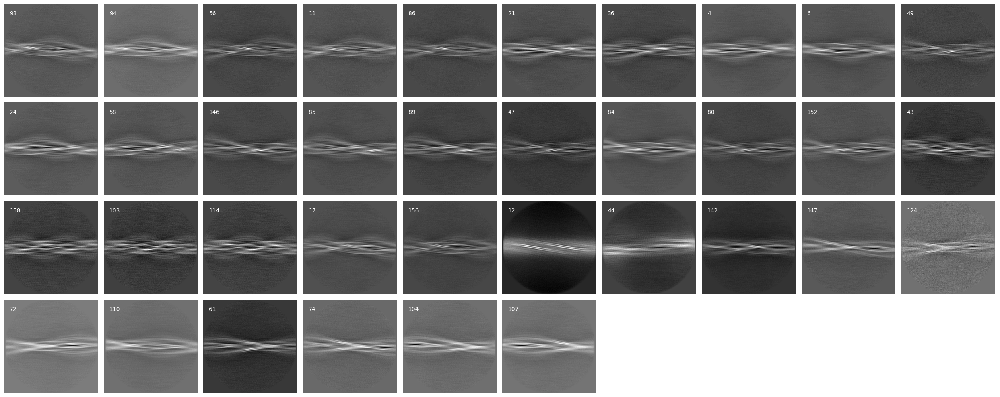

Figure saved as ../ExampleOutput/SL251-2_job007_run_it045_group2_classaverages.png


,rlnReferenceImage,rlnClassDistribution,rlnAccuracyRotations,rlnAccuracyTranslationsAngst,rlnEstimatedResolution,rlnOverallFourierCompleteness,rlnClassPriorOffsetX,rlnClassPriorOffsetY,rlnHelicalRise,rlnHelicalTwist,rlnClassNumber,clusteredOrder
92,000093@Class2D/job007/run_it045_classes.mrcs,0.007879,999.00,999.0000,7.023094,1.000000,0.003824,-0.007850,4.75,0.0,93,4
93,000094@Class2D/job007/run_it045_classes.mrcs,0.014747,0.05,0.2908,6.957458,0.999099,0.002376,-0.028310,4.75,0.0,94,5
55,000056@Class2D/job007/run_it045_classes.mrcs,0.005735,999.00,999.0000,6.957458,1.000000,-0.003990,-0.005020,4.75,0.0,56,6
10,000011@Class2D/job007/run_it045_classes.mrcs,0.008971,999.00,999.0000,7.227650,1.000000,0.001179,-0.014140,4.75,0.0,11,7
85,000086@Class2D/job007/run_it045_classes.mrcs,0.006178,999.00,999.0000,7.298510,0.999571,-0.001050,-0.002530,4.75,0.0,86,8
20,000021@Class2D/job007/run_it045_classes.mrcs,0.013619,0.05,0.2908,7.227650,0.988133,-0.002080,-0.002310,4.75,0.0,21,9
35,000036@Class2D/job007/run_it045_classes.mrcs,0.013301,0.05,0.2908,7.370772,1.000000,0.002455,-0.007020,4.75,0.0,36,10
3,000004@Class2D/job007/run_it045_classes.mrcs,0.017464,0.05,0.2908,7.089981,1.000000,0.006208,0.019637,4.75,0.0,4,11
5,000006@Class2D/job007/run_it045_classes.mrcs,0.018476,0.05,0.2908,6.829798,0.997813,0.006296,0.049418,4.75,0.0,6,12
48,000049@Class2D/job007/run_it045_classes.mrcs,0.003467,999.00,999.0000,7.370772,1.000000,0.002386,0.005839,4.75,0.0,49,13


In [14]:
'''
CELL 2 OF 2 FOR INTERACTIVE SELECTION/OUTPUT, COPY AND PASTE AS NEEDED
'''

# Key Parameters:
selection_output = output + "_group2" # Path to write out selection to 
saveclassaverageplot = True
overwrite = False # Controls whether it is okay to overwrite existing .star files with the same name
# These functions also require the parameters and data structures from the initial clustering cell

# Comment out any of the lines below that you do not want to output!
print([slider.value for slider in sliders]) # Just to remember what we selected in the previous cell
typecluster_interactive_output(sliders, "Filaments", selection_output, clustered, counts_df, IDadded_particle_df = IDadded_particle_df, all_data = all_data, model_star_file = model_star, classIDdict = classIDdict, overwrite = overwrite)
typecluster_interactive_output(sliders, "Particles", selection_output, clustered, counts_df, IDadded_particle_df = IDadded_particle_df, all_data = all_data, model_star_file = model_star, classIDdict = classIDdict, overwrite = overwrite)
selected_interactive_class_averages_df = typecluster_interactive_output(sliders, "Classes", selection_output, clustered, counts_df, model_star_file = model_star, classIDdict = classIDdict, overwrite = overwrite)
plot_class_averages(class_mrcs, classes_df = selected_interactive_class_averages_df, savefig = saveclassaverageplot, filepath = selection_output)
selected_interactive_class_averages_df

Interactive selection is nice if we want to look at specific groups, but becomes tiring if we want to do it for every group. 

We can turn instead to automated selection.

#### Automated Selection - Dendrogram Thresholding

Dendrogram tresholding-based automated selection proceeds in 3 steps:
- We first choose a good threshold using `typecluster_interactive_dendrogram_thresholding`
- We compute and visualize what that clusters looks like on the clustered heatmap with `typecluster_compute_dendrogram_threshold_labels`
- We write out the clusters with `typecluster_output_filaments_from_labels` 

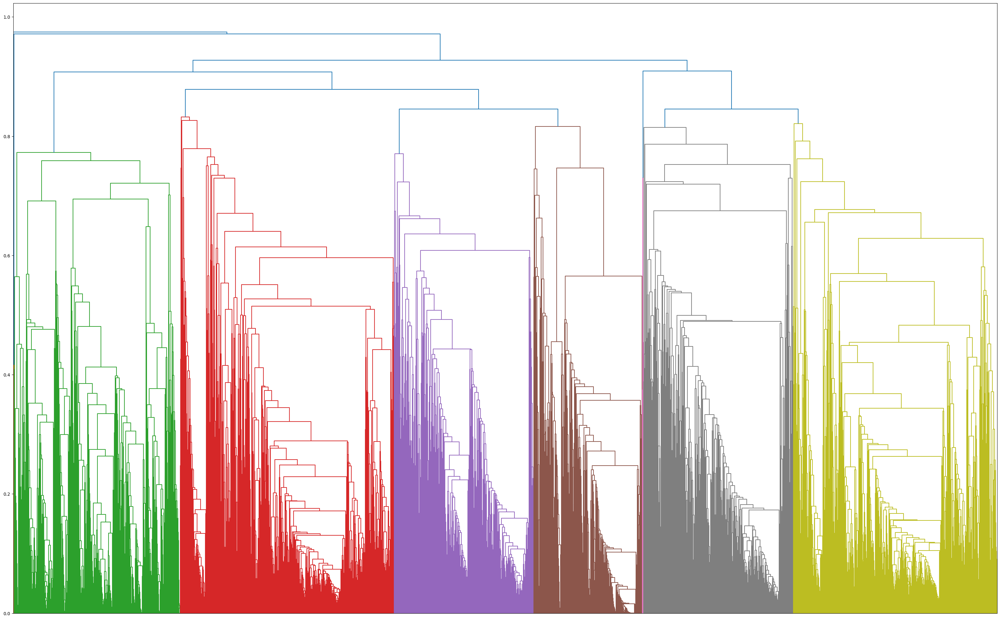

In [15]:
'''
CELL 1 OF 3 FOR AUTOMATED SELECTION/OUTPUT - DENDROGRAM THRESHOLDING

Don't mess with the naming of the variables for the output of this function!
Choose a threshold to try, then hit run. Can repeat until it looks good
'''

threshold_slider, hbox = typecluster_interactive_dendrogram_thresholding("clustered") 

# Looks like 0.84 is a reasonable threshold for this data for the first round of reclassification

In [16]:
help(typecluster_compute_dendrogram_threshold_labels)

Help on function typecluster_compute_dendrogram_threshold_labels in module __main__:

typecluster_compute_dendrogram_threshold_labels(clustered: seaborn.matrix.ClusterGrid, threshold: float, output_path: str, counts_df: pandas.core.frame.DataFrame, savefig: bool = True, vmax: int = None, cmap: str = 'inferno', standardize: int = None, figsize_x: int = 25, figsize_y: int = 25, label_fontsize: int = 15, dpi: int = 300, dendrogram_ratio: float = 0.2, cbar_pos: tuple = (0.02, 0.81, 0.05, 0.17), panel_label: bool = False, panel_label_letter: str = 'a', panel_label_fontsize: int = 15) -> (<class 'list'>, <class 'collections.Counter'>, <class 'seaborn.matrix.ClusterGrid'>)
    Uses fcluster to find filament clusters under a minimum distance_threshold (nominally cosine distance)
    Outputs cluster labels for filaments and a counter of filaments/cluster
    Also plots labeled clusters on clustermap
    
    Params:
        clustered = Clustermap, e.g. from typecluster_initial_clustering
      

Number of filaments/classes per label: Counter({3: 1084, 8: 1033, 2: 841, 7: 758, 4: 707, 5: 550, 6: 6, 1: 4, 9: 1})


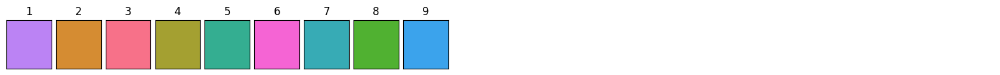

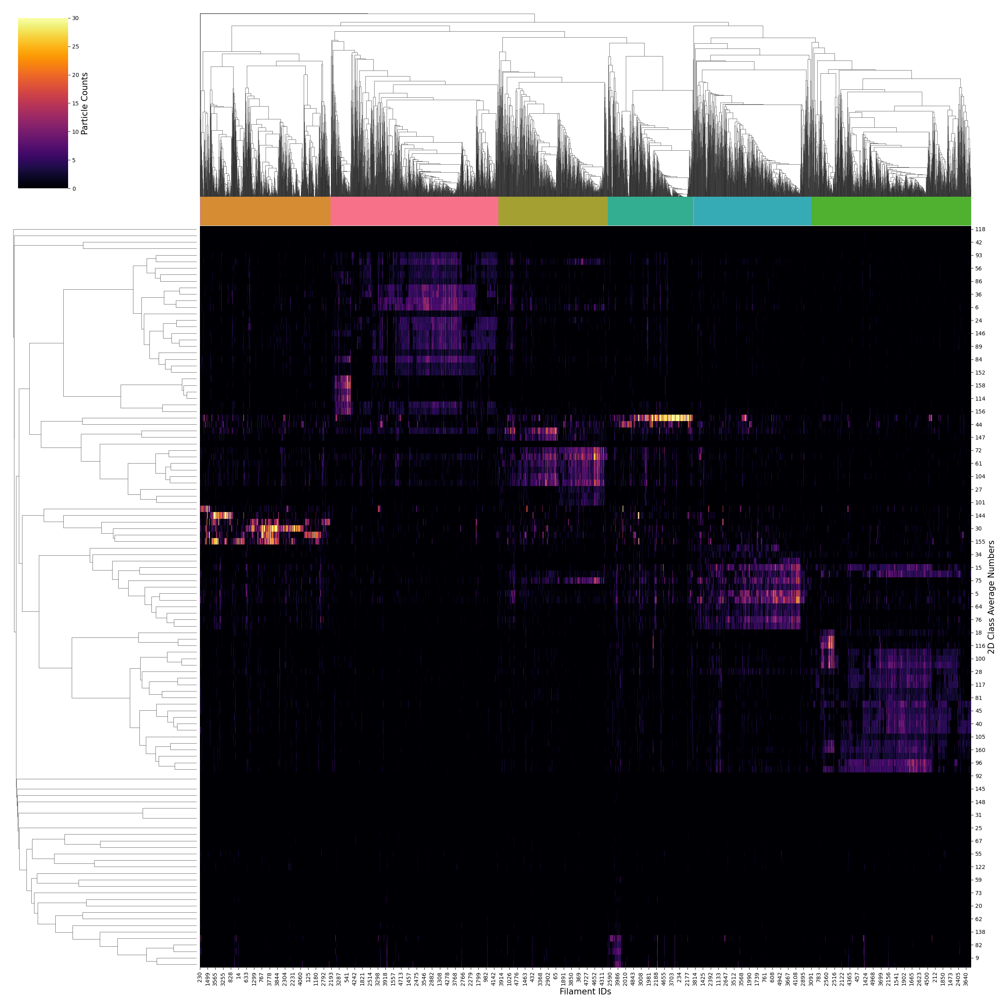

Figure saved as ../ExampleOutput/SL251-2_job007_run_it045_0.84threshold_clustered.png


In [17]:
'''
CELL 2 OF 3 FOR AUTOMATED SELECTION/OUTPUT - DENDROGRAM THRESHOLDING
'''

# Params:
output = output
savefig = True # Controls whether or not to save the colored clustered heatmap figure

col_clustered_labels, labeled_clustered = typecluster_compute_dendrogram_threshold_labels(clustered, threshold_slider.value, output, counts_df, savefig = savefig, vmax = 30)

Yep, we could definitely lower the threshold, but we will wait for future rounds to do that. Let's write out these clusters! 

Clusters with particles below a minimum threshold aren't really usefel as we won't get good 2D classes and will also not be able to get a high-resolution structure by 3D refinement. As such, we can discard/group them together for further analysis.

We now run `typecluster_output_filaments_from_labels`.

In [18]:
help(typecluster_output_filaments_from_labels)

Help on function typecluster_output_filaments_from_labels in module __main__:

typecluster_output_filaments_from_labels(col_labels: list, output_path: str, IDadded_particle_df: pandas.core.frame.DataFrame, all_data: collections.OrderedDict, particle_threshold: int = 1000, overwrite: bool = True, drophashes: bool = True, verbose: bool = True) -> pandas.core.frame.DataFrame
    Writes out .star files containing particles from clusters with particle #s exceeding a threshold
    Clusters that fail this threshold are merged and output as one joint merged particle .star file
    Filament clusters specified by col_labels as a list, which come from k-means or distogram thresholding
    
    Params:
        col_labels = List of labels, probably from kmeans or distogram thresholding
        output_path = path name that will be appended to the front of anything written out (e.g. /TypeClassifer/job009)
        IDadded_particle_df = DataFrame with filamentIDs, probably from typecluster_initial_clus

In [19]:
'''
CELL 3 OF 3 FOR AUTOMATED SELECTION/OUTPUT - DENDROGRAM THRESHOLDING
'''

# Params:
output = output
particle_threshold = 1000 # Minimum number of particles for a cluster, clusters failing threshold will be merged
overwrite = False # Controls whether it is okay to overwrite existing .star files with the same name

labeled_particle_df = typecluster_output_filaments_from_labels(col_clustered_labels, output, IDadded_particle_df, all_data, verbose = True, particle_threshold = particle_threshold, overwrite = overwrite)
labeled_particle_df

Number of filaments/classes per label: Counter({3: 1084, 8: 1033, 2: 841, 7: 758, 4: 707, 5: 550, 6: 6, 1: 4, 9: 1})
45479 particles from filament cluster 2
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045_cluster2_particles.star
73308 particles from filament cluster 3
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045_cluster3_particles.star
46708 particles from filament cluster 4
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045_cluster4_particles.star
33731 particles from filament cluster 5
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045_cluster5_particles.star
48069 particles from filament cluster 7
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045_cluster7_particles.star
69704 particles from filament cluster 8
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045_cluster8_particles.star
Clusters [1, 6, 9] did not pass particle threshold of 1000, so 58 particles will be merged together.
Particles saved as ../ExampleOut

,rlnCoordinateX,rlnCoordinateY,rlnHelicalTubeID,rlnAngleTiltPrior,rlnAnglePsiPrior,rlnHelicalTrackLengthAngst,rlnAnglePsiFlipRatio,rlnImageName,rlnMicrographName,rlnOpticsGroup,...,rlnClassNumber,rlnNormCorrection,rlnLogLikeliContribution,rlnMaxValueProbDistribution,rlnNrOfSignificantSamples,filamentHash,particleHash,classID,filamentID,clusterLabel
0,649.911520,3577.306782,1,90.0,92.449663,256.50,0.5,000001@Extract/job006/Tiff/EER/FoilHole_118999...,MotionCorr/job003/Tiff/EER/FoilHole_11899928_D...,1,...,142,0.495125,242608.1,0.890320,3,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,100,0,3
1,649.073737,3557.723594,1,90.0,92.449663,270.75,0.5,000002@Extract/job006/Tiff/EER/FoilHole_118999...,MotionCorr/job003/Tiff/EER/FoilHole_11899928_D...,1,...,142,0.495183,242560.1,0.746727,3,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,100,0,3
2,648.235953,3538.140406,1,90.0,92.449663,285.00,0.5,000003@Extract/job006/Tiff/EER/FoilHole_118999...,MotionCorr/job003/Tiff/EER/FoilHole_11899928_D...,1,...,17,0.494860,242552.6,0.996716,1,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,11,0,3
3,647.398170,3518.557218,1,90.0,92.449663,299.25,0.5,000004@Extract/job006/Tiff/EER/FoilHole_118999...,MotionCorr/job003/Tiff/EER/FoilHole_11899928_D...,1,...,17,0.494695,242532.0,0.939809,1,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,11,0,3
4,646.560386,3498.974030,1,90.0,92.449663,313.50,0.5,000005@Extract/job006/Tiff/EER/FoilHole_118999...,MotionCorr/job003/Tiff/EER/FoilHole_11899928_D...,1,...,17,0.494559,242551.0,0.964366,3,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,11,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317052,3529.534599,801.230994,3,90.0,55.844811,1268.25,0.5,000264@Extract/job006/Tiff/EER/FoilHole_119033...,MotionCorr/job003/Tiff/EER/FoilHole_11903397_D...,1,...,78,0.498437,242951.5,0.609303,3,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,52,4983,2
317053,3540.539369,785.010693,3,90.0,55.844811,1282.50,0.5,000265@Extract/job006/Tiff/EER/FoilHole_119033...,MotionCorr/job003/Tiff/EER/FoilHole_11903397_D...,1,...,5,0.498560,242965.6,0.428573,10,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,1,4983,2
317054,3551.544139,768.790392,3,90.0,55.844811,1296.75,0.5,000266@Extract/job006/Tiff/EER/FoilHole_119033...,MotionCorr/job003/Tiff/EER/FoilHole_11903397_D...,1,...,78,0.498761,242971.8,0.266165,4,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,52,4983,2
317055,3562.548909,752.570091,3,90.0,55.844811,1311.00,0.5,000267@Extract/job006/Tiff/EER/FoilHole_119033...,MotionCorr/job003/Tiff/EER/FoilHole_11903397_D...,1,...,78,0.498399,242957.3,0.721593,3,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,52,4983,2


Optionally, we can also plot the clusters on a dimensionality reduction plot of our choice - UMAP, t-SNE, PCA.

There's generally no real reason to do this since the clustermap captures the distribution of filaments better, but it provides a different visualzation.

In [20]:
help(dimensionality_reduction_plot)

Help on function dimensionality_reduction_plot in module __main__:

dimensionality_reduction_plot(counts_df, mode: str = 'UMAP', savefig: bool = True, filepath: str = None, figsize_x: float = 25, figsize_y: float = 25, subfigure_label_fontsize=25, title_fontsize=30, axis_label_fontsize=20, alpha=0.1, row_colors: list = None, col_colors: list = None, random_seed: int = 365)
    Performs dimensionality reduction on filaments or classes and plots/optionally saves figure
    Can choose from PCA/t-SNE/UMAP, and can also color by type by providing color labels
    Generally, no real reason to use this over the hierarchical clustering plot but it is available.



Number of filaments/classes per label: Counter({3: 1084, 8: 1033, 2: 841, 7: 758, 4: 707, 5: 550, 6: 6, 1: 4, 9: 1})


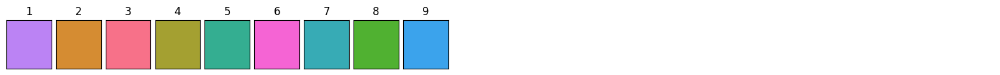

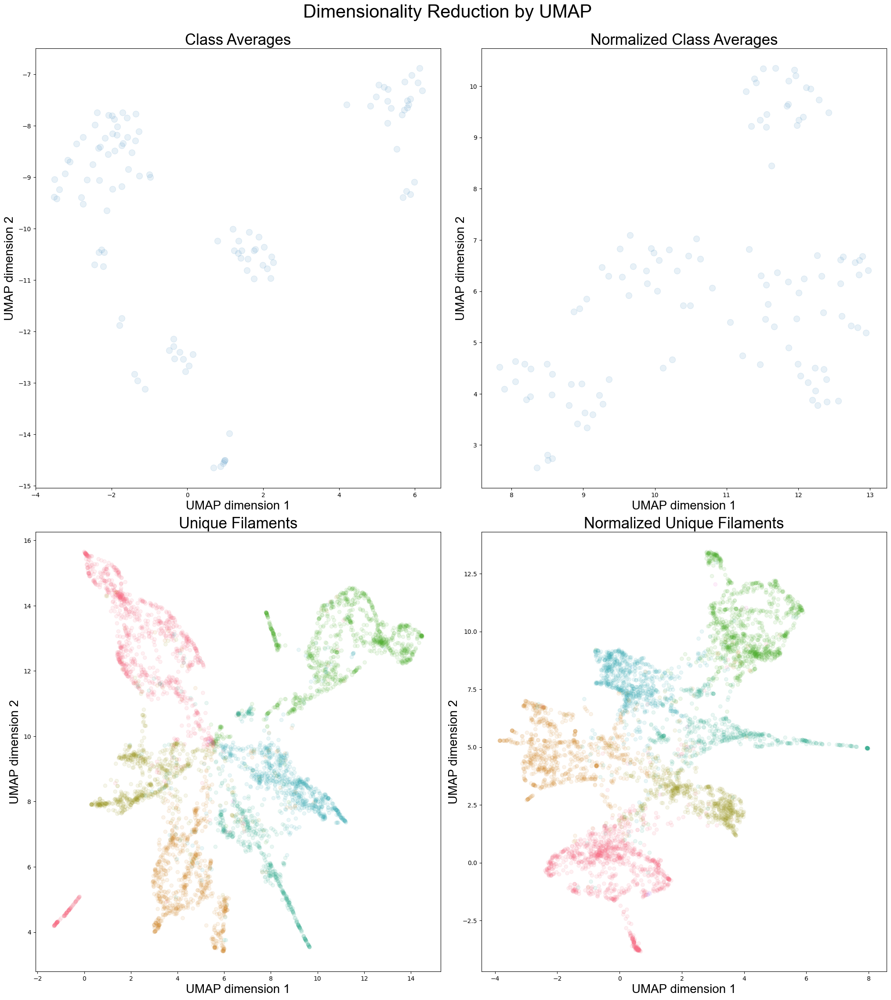

Figure saved as ../ExampleOutput/SL251-2_job007_run_it045_dimensionalityreduction_UMAP.png


In [21]:
'''
CELL 2.5 OF 3 FOR AUTOMATED SELECTION/OUTPUT - DENDROGRAM THRESHOLDING (OPTIONAL)

Dimensionality reduction plot, run after cell 2 of 3, if ever
'''

# Params:
savefig = True
output = output
mode = "UMAP" # choose from "UMAP", "PCA", and "t-SNE"

col_clustered_colors = convert_labels_to_colors(col_clustered_labels)
dimensionality_reduction_plot(counts_df, mode = mode, savefig = savefig, filepath = output, col_colors = col_clustered_colors)

#### Automated Selection - k-means

Alternatively we can use k-means to do automated clustering on the filament-level. Generally this seems to do worse than the dendrogram thresholding. 

However, if the hierarchical clustering takes prohibitively long to run, it may be better for speed purposes. We can use it without requiring the clustering by computing the `counts_df` standalone using `read_particle_star`, `hash_particle_df`, and `compute_particle_counts_df`.

Regardless of how we arrive at a `counts_df`, we then use `typecluster_compute_kmeans_labels` and `typecluster_output_filaments_from_labels` to compute k-means labels and output filaments. We can also use `dimensionality_reduction_plot` to visualize the k-means output if we did not compute a clustering. 

In [22]:
'''
CELL 0 OF 2 FOR AUTOMATED SELECTION/OUTPUT - K-MEANS (OPTIONAL)

Can use this cell if an initial clustering has not been performed
'''
particle_df, all_data = read_particle_star(particle_star)
hashed_particle_df = hash_particle_df(particle_df)
counts_df, IDadded_particle_df, classcount, classIDdict, filamentcount, filamentIDdict = compute_particle_counts_df(hashed_particle_df)
counts_df

Total filaments: 4984 and total particles: 317057
Total classes = 114, total particles = 317057 and total filaments = 4984
Particles per class:  Counter({12: 16334, 30: 9611, 66: 8142, 155: 8121, 15: 8082, 142: 8039, 75: 7705, 78: 7492, 110: 7401, 5: 7266, 69: 7209, 44: 6599, 107: 6230, 6: 5857, 144: 5572, 4: 5540, 14: 5165, 76: 5096, 61: 4905, 72: 4880, 96: 4853, 104: 4837, 99: 4759, 94: 4678, 84: 4633, 151: 4510, 21: 4321, 36: 4218, 74: 3878, 24: 3868, 58: 3793, 106: 3755, 28: 3745, 87: 3710, 160: 3708, 100: 3706, 89: 3648, 40: 3625, 50: 3576, 17: 3535, 85: 3424, 54: 3330, 79: 3221, 156: 3203, 10: 3203, 146: 3192, 83: 3187, 117: 3066, 127: 3062, 98: 3047, 64: 3023, 147: 2945, 11: 2851, 45: 2633, 112: 2519, 93: 2500, 152: 2339, 154: 2241, 80: 2209, 81: 2126, 23: 2030, 86: 1961, 8: 1858, 116: 1844, 56: 1816, 105: 1766, 47: 1682, 34: 1672, 18: 1638, 158: 1420, 101: 1329, 16: 1315, 43: 1278, 119: 1230, 109: 1200, 114: 1176, 27: 1162, 49: 1099, 95: 956, 97: 862, 60: 838, 103: 830, 82: 513

filamentID,0,1,2,3,4,5,6,7,8,9,...,4974,4975,4976,4977,4978,4979,4980,4981,4982,4983
rlnClassNumber,,,,,,,,,,,,,,,,,,,,,
4,2.0,3.0,7.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,3.0,0.0,0.0,6.0,0.0,7.0,6.0,0.0,0.0
5,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,...,5.0,4.0,0.0,1.0,0.0,12.0,1.0,0.0,0.0,1.0
6,0.0,3.0,6.0,0.0,1.0,10.0,4.0,0.0,0.0,0.0,...,0.0,5.0,0.0,0.0,6.0,1.0,7.0,7.0,0.0,0.0
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,6.0,0.0,0.0,0.0,0.0
9,4.0,1.0,0.0,2.0,4.0,0.0,0.0,0.0,0.0,4.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,...,0.0,0.0,3.0,0.0,0.0,1.0,0.0,0.0,5.0,0.0
155,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,17.0,0.0,...,0.0,3.0,3.0,0.0,0.0,2.0,0.0,0.0,0.0,14.0
156,3.0,3.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,6.0,0.0,5.0,0.0,0.0,0.0


In [23]:
help(typecluster_compute_kmeans_labels)

Help on function typecluster_compute_kmeans_labels in module __main__:

typecluster_compute_kmeans_labels(counts_df, col_cluster_number: int = 10, row_cluster_number: int = 10, random_seed: int = 365) -> (<class 'list'>, <class 'list'>)
    Compute k-means labels for class averages (row_clusters) and unique filaments (col_clusters)
    Returns a list for each containing the cluster number of each



Number of filaments/classes per label: Counter({1: 77, 3: 20, 0: 9, 4: 7, 2: 1})


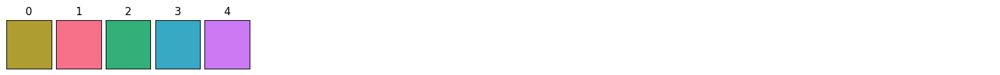

Number of filaments/classes per label: Counter({8: 1162, 3: 1042, 7: 867, 6: 824, 5: 236, 4: 236, 2: 214, 0: 186, 9: 118, 1: 99})


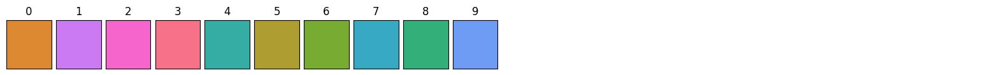

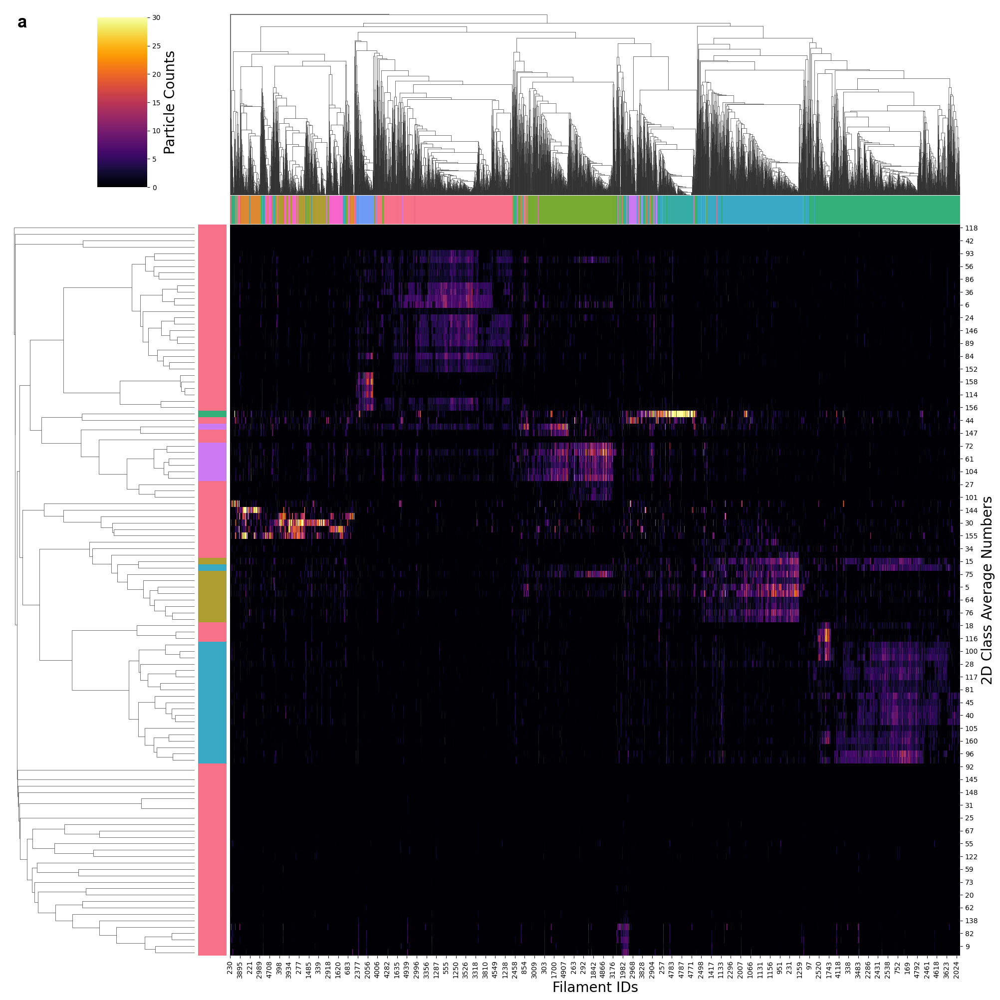

Figure saved as ../ExampleOutput/SL251-2_job007_run_it045kmeans_clustered.png


In [24]:
'''
CELL 1 OF 2 FOR AUTOMATED SELECTION/OUTPUT - K-MEANS
'''

# Params:
class_average_cluster_number = 5
filament_cluster_number = 10 # Number of clusters to use for k-means on filaments
clustering_computed = True # Set to True if clustering previously computed, else do set to false, controls plot
kmeansoutput = output + "kmeans"
savefig = True # Controls whether or not to save the colored clustered heatmap figure

row_kmeans_labels, col_kmeans_labels = typecluster_compute_kmeans_labels(counts_df, col_cluster_number = filament_cluster_number, row_cluster_number = class_average_cluster_number)
if clustering_computed: 
    row_colors = convert_labels_to_colors(row_kmeans_labels)
    col_colors = convert_labels_to_colors(col_kmeans_labels)
    kmeans_clusterplot = clusterplot_counts_df(counts_df, savefig = savefig, filepath = kmeansoutput, vmax = 30, figsize_x = 20, figsize_y = 20, 
                                  label_fontsize=20, cbar_pos = (0.1, 0.81, 0.05, 0.17), panel_label = True, 
                                  panel_label_fontsize = 25, row_colors = row_colors, col_colors = col_colors,
                                  row_linkage = clustered.dendrogram_row.linkage, col_linkage = clustered.dendrogram_col.linkage)

Number of filaments/classes per label: Counter({1: 77, 3: 20, 0: 9, 4: 7, 2: 1})


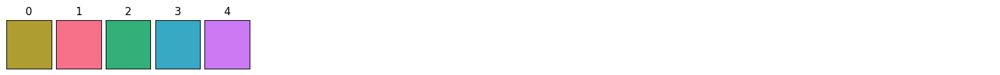

Number of filaments/classes per label: Counter({8: 1162, 3: 1042, 7: 867, 6: 824, 5: 236, 4: 236, 2: 214, 0: 186, 9: 118, 1: 99})


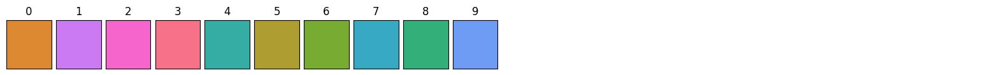

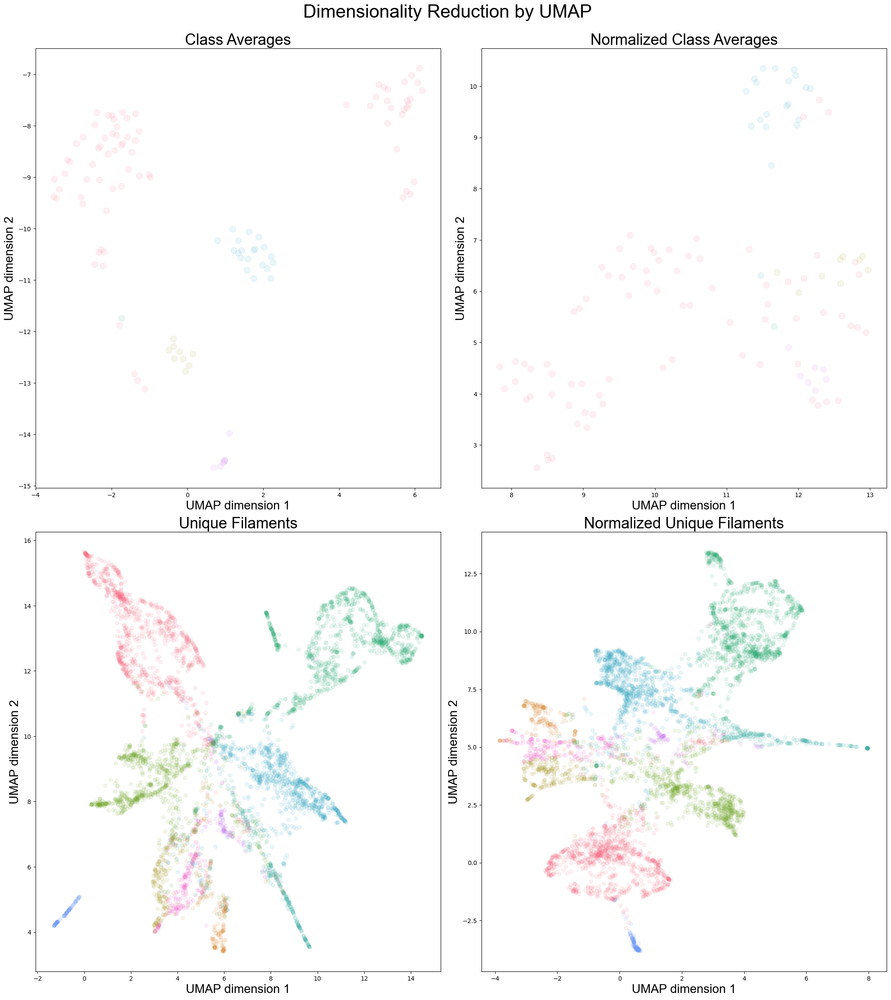

Figure saved as ../ExampleOutput/SL251-2_job007_run_it045kmeans_dimensionalityreduction_UMAP.png


In [25]:
'''
CELL 1.5 OF 2 FOR AUTOMATED SELECTION/OUTPUT - K-MEANS (OPTIONAL)

Optional, but makes sense to plot dimensionality reduction plot if clustering not computed
Run after cell 1 of 2
'''

# Params:
savefig = True
kmeansoutput = output + "kmeans"
mode = "UMAP" # choose from "UMAP", "PCA", and "t-SNE"

row_colors = convert_labels_to_colors(row_kmeans_labels)
col_colors = convert_labels_to_colors(col_kmeans_labels)
dimensionality_reduction_plot(counts_df, mode = mode, savefig = savefig, filepath = kmeansoutput, row_colors = row_colors, col_colors = col_colors)

In [26]:
'''
CELL 2 OF 2 FOR AUTOMATED SELECTION/OUTPUT - K-MEANS
'''

# Params:
kmeansoutput = output + "kmeans" #  Path for output
particle_threshold = 1000 # Minimum number of particles for a cluster, clusters failing threshold will be merged
overwrite = False # Controls whether it is okay to overwrite existing .star files with the same name

labeled_kmeans_particle_df = typecluster_output_filaments_from_labels(col_clustered_labels, kmeansoutput, IDadded_particle_df, all_data, verbose = True, particle_threshold = particle_threshold, overwrite = overwrite)
labeled_kmeans_particle_df

Number of filaments/classes per label: Counter({3: 1084, 8: 1033, 2: 841, 7: 758, 4: 707, 5: 550, 6: 6, 1: 4, 9: 1})
45479 particles from filament cluster 2
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045kmeans_cluster2_particles.star
73308 particles from filament cluster 3
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045kmeans_cluster3_particles.star
46708 particles from filament cluster 4
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045kmeans_cluster4_particles.star
33731 particles from filament cluster 5
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045kmeans_cluster5_particles.star
48069 particles from filament cluster 7
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045kmeans_cluster7_particles.star
69704 particles from filament cluster 8
Particles saved as ../ExampleOutput/SL251-2_job007_run_it045kmeans_cluster8_particles.star
Clusters [1, 6, 9] did not pass particle threshold of 1000, so 58 particles will be merged togeth

,rlnCoordinateX,rlnCoordinateY,rlnHelicalTubeID,rlnAngleTiltPrior,rlnAnglePsiPrior,rlnHelicalTrackLengthAngst,rlnAnglePsiFlipRatio,rlnImageName,rlnMicrographName,rlnOpticsGroup,...,rlnClassNumber,rlnNormCorrection,rlnLogLikeliContribution,rlnMaxValueProbDistribution,rlnNrOfSignificantSamples,filamentHash,particleHash,classID,filamentID,clusterLabel
0,649.911520,3577.306782,1,90.0,92.449663,256.50,0.5,000001@Extract/job006/Tiff/EER/FoilHole_118999...,MotionCorr/job003/Tiff/EER/FoilHole_11899928_D...,1,...,142,0.495125,242608.1,0.890320,3,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,100,0,3
1,649.073737,3557.723594,1,90.0,92.449663,270.75,0.5,000002@Extract/job006/Tiff/EER/FoilHole_118999...,MotionCorr/job003/Tiff/EER/FoilHole_11899928_D...,1,...,142,0.495183,242560.1,0.746727,3,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,100,0,3
2,648.235953,3538.140406,1,90.0,92.449663,285.00,0.5,000003@Extract/job006/Tiff/EER/FoilHole_118999...,MotionCorr/job003/Tiff/EER/FoilHole_11899928_D...,1,...,17,0.494860,242552.6,0.996716,1,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,11,0,3
3,647.398170,3518.557218,1,90.0,92.449663,299.25,0.5,000004@Extract/job006/Tiff/EER/FoilHole_118999...,MotionCorr/job003/Tiff/EER/FoilHole_11899928_D...,1,...,17,0.494695,242532.0,0.939809,1,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,11,0,3
4,646.560386,3498.974030,1,90.0,92.449663,313.50,0.5,000005@Extract/job006/Tiff/EER/FoilHole_118999...,MotionCorr/job003/Tiff/EER/FoilHole_11899928_D...,1,...,17,0.494559,242551.0,0.964366,3,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,1MotionCorr/job003/Tiff/EER/FoilHole_11899928_...,11,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
317052,3529.534599,801.230994,3,90.0,55.844811,1268.25,0.5,000264@Extract/job006/Tiff/EER/FoilHole_119033...,MotionCorr/job003/Tiff/EER/FoilHole_11903397_D...,1,...,78,0.498437,242951.5,0.609303,3,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,52,4983,2
317053,3540.539369,785.010693,3,90.0,55.844811,1282.50,0.5,000265@Extract/job006/Tiff/EER/FoilHole_119033...,MotionCorr/job003/Tiff/EER/FoilHole_11903397_D...,1,...,5,0.498560,242965.6,0.428573,10,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,1,4983,2
317054,3551.544139,768.790392,3,90.0,55.844811,1296.75,0.5,000266@Extract/job006/Tiff/EER/FoilHole_119033...,MotionCorr/job003/Tiff/EER/FoilHole_11903397_D...,1,...,78,0.498761,242971.8,0.266165,4,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,52,4983,2
317055,3562.548909,752.570091,3,90.0,55.844811,1311.00,0.5,000267@Extract/job006/Tiff/EER/FoilHole_119033...,MotionCorr/job003/Tiff/EER/FoilHole_11903397_D...,1,...,78,0.498399,242957.3,0.721593,3,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,3MotionCorr/job003/Tiff/EER/FoilHole_11903397_...,52,4983,2


By any of these 3 selection methods, particles are now ready for further reclassification, refinement, and analysis!

# For you to run!

Should be all set to start, can always call `help(function_of_your_choice)` on any function to have a more detailed listing of the parameter options

In [ ]:
# Key Parameters:
particle_star = "../ExampleData/SL251-2_job007_run_it045_data.star" # Path to data.star file from Class2D job
model_star = "../ExampleData/SL251-2_job007_run_it045_model.star" # Path to model.star file from Class2D job
class_mrcs = "../ExampleData/SL251-2_job007_run_it045_classes.mrcs" # Path to classes.mrcs file from Class2D job
output = "../ExampleOutput/SL251-2_job007_run_it045" # Desired output path that will be appended to all outputs
savefig = True # Controls whether or not to save the clustered heatmap figure
savestar = True # Controls whether or not to save the reordered class averages 
saveclassaverageplot = True # Controls whether or not to save the class average figures
overwrite = False # Controls whether it is okay to overwrite existing .star files with the same name

clustered, counts_df, IDadded_particle_df, all_data, classcount, classIDdict, filamentcount, filamentIDdict = typecluster_initial_clustering(particle_star, output_path = output, savefig = savefig, vmax = 30)
reordered_classes_df = reorder_class_average_star_by_clustered(model_star, clustered, classIDdict, output_path = output, savestar = savestar, overwrite = overwrite)
plot_class_averages(class_mrcs, classes_df = reordered_classes_df, savefig = saveclassaverageplot, filepath = output)

In [ ]:
'''
CELL 1 OF 2 FOR INTERACTIVE SELECTION/OUTPUT, COPY AND PASTE AS NEEDED

Note: indexes from 0 and we don't actually need x-end > x-start or y-end > y-start
The start and end coordinate x-y pairs are connected though
Selections include the boxes where the dotted outlines appear
Can save an image of your selection with the camera-looking "Download plot as a png" button
'''

sliders = typecluster_interactive_select(counts_df, clustered)
# We can keep track of our selected group here: group1, x: 860-976 y: 20-28

In [ ]:
'''
CELL 2 OF 2 FOR INTERACTIVE SELECTION/OUTPUT, COPY AND PASTE AS NEEDED
'''

# Key Parameters:
selection_output = output + "_group1" # Path to write out selection to 
saveclassaverageplot = True # Controls whether or not to save the class average figures
overwrite = False # Controls whether it is okay to overwrite existing .star files with the same name
# These functions also require the parameters and data structures from the initial clustering cell

# Comment out any of the lines below that you do not want to output!
print([slider.value for slider in sliders]) # Just to remember what we selected in the previous cell
typecluster_interactive_output(sliders, "Filaments", selection_output, clustered, counts_df, IDadded_particle_df = IDadded_particle_df, all_data = all_data, model_star_file = model_star, classIDdict = classIDdict, overwrite = overwrite)
typecluster_interactive_output(sliders, "Particles", selection_output, clustered, counts_df, IDadded_particle_df = IDadded_particle_df, all_data = all_data, model_star_file = model_star, classIDdict = classIDdict, overwrite = overwrite)
selected_interactive_class_averages_df = typecluster_interactive_output(sliders, "Classes", selection_output, clustered, counts_df, model_star_file = model_star, classIDdict = classIDdict, overwrite = overwrite)
plot_class_averages(class_mrcs, classes_df = selected_interactive_class_averages_df, savefig = saveclassaverageplot, filepath = selection_output)
selected_interactive_class_averages_df 

In [ ]:
'''
CELL 1 OF 3 FOR AUTOMATED SELECTION/OUTPUT - DENDROGRAM THRESHOLDING

Don't mess with the naming of the variables for the output of this function!
Choose a threshold to try, then hit run. Can repeat until it looks good
'''

threshold_slider, hbox = typecluster_interactive_dendrogram_thresholding("clustered") 

# Looks like 0.84 is a reasonable threshold for this data for the first round of reclassification

In [ ]:
'''
CELL 2 OF 3 FOR AUTOMATED SELECTION/OUTPUT - DENDROGRAM THRESHOLDING
'''

# Params:
output = output
savefig = True # Controls whether or not to save the colored clustered heatmap figure

col_clustered_labels, labeled_clustered = typecluster_compute_dendrogram_threshold_labels(clustered, threshold_slider.value, output, counts_df, savefig = savefig, vmax = 30)

In [ ]:
'''
CELL 2.5 OF 3 FOR AUTOMATED SELECTION/OUTPUT - DENDROGRAM THRESHOLDING (OPTIONAL)

Dimensionality reduction plot, run after cell 2 of 3, if ever
'''

# Params:
savefig = True
output = output
mode = "UMAP" # choose from "UMAP", "PCA", and "t-SNE"

col_clustered_colors = convert_labels_to_colors(col_clustered_labels)
dimensionality_reduction_plot(counts_df, mode = mode, savefig = savefig, filepath = output, col_colors = col_clustered_colors)

In [ ]:
'''
CELL 3 OF 3 FOR AUTOMATED SELECTION/OUTPUT - DENDROGRAM THRESHOLDING
'''

# Params:
output = output
particle_threshold = 1000 # Minimum number of particles for a cluster, clusters failing threshold will be merged
overwrite = False # Controls whether it is okay to overwrite existing .star files with the same name

labeled_particle_df = typecluster_output_filaments_from_labels(col_clustered_labels, output, IDadded_particle_df, all_data, verbose = True, particle_threshold = particle_threshold, overwrite = overwrite)
labeled_particle_df

In [ ]:
'''
CELL 0 OF 2 FOR AUTOMATED SELECTION/OUTPUT - K-MEANS (OPTIONAL)

Can use this cell if an initial clustering has not been performed
'''
particle_df, all_data = read_particle_star(particle_star)
hashed_particle_df = hash_particle_df(particle_df)
counts_df, IDadded_particle_df, classcount, classIDdict, filamentcount, filamentIDdict = compute_particle_counts_df(hashed_particle_df)
counts_df

In [ ]:
'''
CELL 1 OF 2 FOR AUTOMATED SELECTION/OUTPUT - K-MEANS
'''

# Params:
class_average_cluster_number = 5
filament_cluster_number = 10 # Number of clusters to use for k-means on filaments
clustering_computed = True # Set to True if clustering previously computed, else do set to false, controls plot
kmeansoutput = output + "kmeans"
savefig = True # Controls whether or not to save the colored clustered heatmap figure

row_kmeans_labels, col_kmeans_labels = typecluster_compute_kmeans_labels(counts_df, col_cluster_number = filament_cluster_number, row_cluster_number = class_average_cluster_number)
if clustering_computed: 
    row_colors = convert_labels_to_colors(row_kmeans_labels)
    col_colors = convert_labels_to_colors(col_kmeans_labels)
    kmeans_clusterplot = clusterplot_counts_df(counts_df, savefig = savefig, filepath = kmeansoutput, vmax = 30, figsize_x = 20, figsize_y = 20, 
                                  label_fontsize=20, cbar_pos = (0.1, 0.81, 0.05, 0.17), panel_label = True, 
                                  panel_label_fontsize = 25, row_colors = row_colors, col_colors = col_colors,
                                  row_linkage = clustered.dendrogram_row.linkage, col_linkage = clustered.dendrogram_col.linkage)

In [ ]:
'''
CELL 1.5 OF 2 FOR AUTOMATED SELECTION/OUTPUT - K-MEANS (OPTIONAL)

Optional, but makes sense to plot dimensionality reduction plot if clustering not computed
Run after cell 1 of 2
'''

# Params:
savefig = True
kmeansoutput = output + "kmeans"
mode = "UMAP" # choose from "UMAP", "PCA", and "t-SNE"

row_colors = convert_labels_to_colors(row_kmeans_labels)
col_colors = convert_labels_to_colors(col_kmeans_labels)
dimensionality_reduction_plot(counts_df, mode = mode, savefig = savefig, filepath = kmeansoutput, row_colors = row_colors, col_colors = col_colors)

In [ ]:
'''
CELL 2 OF 2 FOR AUTOMATED SELECTION/OUTPUT - K-MEANS
'''

# Params:
kmeansoutput = output + "kmeans" #  Path for output
particle_threshold = 1000 # Minimum number of particles for a cluster, clusters failing threshold will be merged
overwrite = False # Controls whether it is okay to overwrite existing .star files with the same name

labeled_kmeans_particle_df = typecluster_output_filaments_from_labels(col_clustered_labels, kmeansoutput, IDadded_particle_df, all_data, verbose = True, particle_threshold = particle_threshold, overwrite = overwrite)
labeled_kmeans_particle_df